# IS4226 Mid Term

1. Develop backtesters for these strategies and test the strategy on in-sample data
    1. To keep things simple, all groups will test their strategy on an equal weighted portfolio of MAANG stocks from 01/01/2015 to 31/12/2019 on daily frequency data.
    2. Please note that this time, you need to do just in-sample testing and report what different variations you have tried.  In the final semester project, You will do out-of-sample testing to finalize strategies.
1. Prepare a notebook with significant markups, and please explain your code through comments. 
2. Please also describe the idea/strategy in the notebook at the start. The more understandable your notebook, the better it will be.
3. Report Strategy Risk, Returns, and performance metrics for MAANG stocks portfolio. Visualizations are optional but will be a bonus if you do that.

# Strategy 1 : RSI Momentum

# Introduction

## RSI
[Insert Explanation Here]

## Market Cap Weighted RSI
[Insert Explanation Here]

## Strategy
[Insert Explanation Here]

# Data

In [1]:


maang_stocks = [
    "MSFT",  # Microsoft
    "AAPL",  # Apple
    "AMZN",  # Amazon
    "NFLX",  # Netflix
    "GOOGL"  # Alphabet (Google)
]

# YFinanceStrategy - Analysis of a single strategy

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Dict
import yfinance as yf
from datetime import datetime, timezone, timedelta
from matplotlib.gridspec import GridSpec

def prepare_data(symbol: str, start_date: str, end_date: str, interval: str) -> pd.DataFrame:
    """
    Prepare stock data including market cap for a given symbol. Override if more data is needed.
    
    :param symbol: Stock symbol (e.g., 'AAPL')
    :param start_date: Start date for historical data (e.g., '2020-01-01'). (YYYY-MM-DD)
    :param end_date: End date for historical data(e.g., '2020-01-01'). (YYYY-MM-DD)
    :param interval: Data interval (default is '1d' for daily)
    :return: DataFrame with prepared stock data
    """
    # Fetch stock data
    data = yf.Ticker(symbol)
    # Get historical data
    df = data.history(start=start_date, end=end_date, interval=interval).reset_index()
    # Convert date to UTC timestamp
    df['timestamp_utc'] = (pd.to_datetime(df['Date']).dt.tz_convert('UTC').astype(int) // 10**6)
    # Calculate returns and log returns
    df['returns_close'] = (df['Close'] / df['Close'].shift(1)) - 1
    df['logreturns_close'] = np.log(df['Close'] / df['Close'].shift(1))
    info = data.info
    market_cap = info.get('marketCap', None)
    df['MC'] = market_cap
    # Sort and reset index
    df = df.sort_values(by='timestamp_utc', ascending=True).reset_index(drop=True)
    return df

def calculate_beta(returns_strategy, returns_benchmark):
    covariance = np.cov(returns_strategy.dropna(), returns_benchmark.dropna())[0, 1]
    benchmark_variance = np.var(returns_benchmark.dropna())
    return covariance / benchmark_variance if benchmark_variance != 0 else np.nan

def calculate_alpha(beta, df_strategy, strategy_column, df_benchmark, benchmark_column, risk_free_rate):
    annualized_returns_strategy = calculate_annualized_return(df_strategy, strategy_column)
    annualized_returns_benchmark = calculate_annualized_return(df_benchmark, benchmark_column)
    return annualized_returns_strategy - (risk_free_rate + beta * (annualized_returns_benchmark - risk_free_rate))

def calculate_annualized_return(dataframe, column_name):
    total_return = (1 + dataframe[column_name]).prod() - 1
    n_years = len(dataframe) / 252  # Assuming 252 trading days in a year
    return (1 + total_return) ** (1 / n_years) - 1


class YFinanceStrategy:
    def __init__(self, symbol: str, start_date: str, end_date: str, interval: str, params : dict = {}, benchmark_symbol : str = "^GSPC", risk_free_rate : float = 0.0) -> None:
        self.symbol = symbol
        self.benchmark_symbol = benchmark_symbol
        self.start_date = start_date
        self.end_date = end_date
        self.interval = interval
        self.params = params
        self.trades = None
        self.performance = None
        self.data_strategy = prepare_data(symbol=self.symbol, start_date=self.start_date, end_date=self.end_date, interval=self.interval)
        self.data_benchmark = prepare_data(symbol=self.benchmark_symbol, start_date=self.start_date, end_date=self.end_date, interval=self.interval)
        self.risk_free_rate = risk_free_rate
    def strategy(self) -> pd.DataFrame:
        """
        Generate a signal column, 1 for Long, -1 for Short, 0 for no position.
        """
        raise NotImplementedError("Strategy method must be implemented")

    def generate_trades(self, strategy_signal_column='signal', strategy_price_column='Close') -> pd.DataFrame:
        """
        Calculate trades based on the strategy signal.
        """
        if self.data_strategy is None:
            raise ValueError("Data must be fetched first. Try calling self.fetch_data()")
        if self.data_strategy[strategy_signal_column].mean() == 0:
            print("No trades executed")
            self.trades = []
        
        self.data_strategy['signal_change'] = self.data_strategy[strategy_signal_column] != self.data_strategy[strategy_signal_column].shift(1)
        
        trades = []
        open_trade = None

        for idx, row in self.data_strategy[self.data_strategy['signal_change']].iterrows():
            current_signal = row[strategy_signal_column]
            
            if open_trade is None:
                if current_signal != 0:
                    open_trade = {
                        'entry_datetime': datetime.fromtimestamp(row['timestamp_utc'] / 1000, tz=timezone.utc),
                        'entry_price': row[strategy_price_column],
                        'position': current_signal
                    }
            else:
                exit_datetime = datetime.fromtimestamp(row['timestamp_utc'] / 1000, tz=timezone.utc)
                duration = exit_datetime - open_trade['entry_datetime']
                exit_price = row[strategy_price_column]
                pnl = (exit_price - open_trade['entry_price']) * open_trade['position']
                pnl_pct = (pnl / abs(open_trade['entry_price'])) * 100
                
                trades.append({
                    'entry_datetime': open_trade['entry_datetime'],
                    'exit_datetime': exit_datetime,
                    'duration': duration,
                    'entry_price': open_trade['entry_price'],
                    'exit_price': exit_price,
                    'pnl': pnl,
                    'pnl%': pnl_pct,
                    'position': open_trade['position'],
                    'win': 1 if pnl > 0 else 0
                })
                
                if current_signal != 0:
                    open_trade = {
                        'entry_datetime': exit_datetime,
                        'entry_price': exit_price,
                        'position': current_signal
                    }
                else:
                    open_trade = None
        
        if open_trade is not None:
            last_row = self.data_strategy.iloc[-1]
            exit_datetime = datetime.fromtimestamp(last_row['timestamp_utc'] / 1000, tz=timezone.utc)
            duration = exit_datetime - open_trade['entry_datetime']
            exit_price = last_row[strategy_price_column]
            pnl = (exit_price - open_trade['entry_price']) * open_trade['position']
            pnl_pct = (pnl / abs(open_trade['entry_price'])) * 100
            
            trades.append({
                'entry_datetime': open_trade['entry_datetime'],
                'exit_datetime': exit_datetime,
                'duration': duration,
                'entry_price': open_trade['entry_price'],
                'exit_price': exit_price,
                'pnl': pnl,
                'pnl%': pnl_pct,
                'position': open_trade['position'],
                'win': 1 if pnl > 0 else 0
            })
        self.trades = trades
        # return trades
    def calculate_trades_performance(self):
        """
        Calculate trades performance metrics. calculate_trades() must be called first.
        """
        if self.trades is None:
            raise ValueError("Trades must be calculated first. Try calling self.calculate_trades()")
        if self.trades == []:
            print("No trades executed. Empty Trades performance.")
            return {}
        df_trades = pd.DataFrame(self.trades)
        num_trades = len(df_trades)
        win_rate = round(df_trades['win'].mean(), 5)
        avg_win = df_trades[df_trades['win'] == 1]['pnl'].mean()
        avg_loss = abs(df_trades[df_trades['win'] == 0]['pnl'].mean())
        reward_risk_ratio = avg_win / avg_loss if avg_loss != 0 else np.inf
        expectancy = (win_rate * avg_win) - ((1 - win_rate) * avg_loss)
        avg_duration = df_trades['duration'].mean()
        
        return {
            'number_of_trades': num_trades,
            'win_rate': win_rate,
            'reward_risk_ratio': reward_risk_ratio,
            'expectancy': expectancy,
            'avg_trade_duration': avg_duration,
        }
    def calculate_strategy_metrics(self) -> Dict[str, float]:
        if self.trades is None:
            raise ValueError("Trades must be calculated first. Try calling self.calculate_trades()")
        if self.trades == []:
            print("No trades executed. Empty Trades performance.")
            self.performance = {}
            return
        beta = calculate_beta(returns_strategy=self.data_strategy['returns_strategy'], 
                            returns_benchmark=self.data_benchmark['returns_close'])
        alpha = calculate_alpha(beta = beta,
                                df_strategy = self.data_strategy, strategy_column = 'returns_strategy',
                                df_benchmark = self.data_benchmark, benchmark_column = 'returns_close',
                                risk_free_rate = 0)
        annualized_returns = calculate_annualized_return(dataframe=self.data_strategy, column_name='returns_strategy')
        annualized_volatility = self.data_strategy['returns_strategy'].std() * np.sqrt(252)
        annualized_sharpe = ((calculate_annualized_return(self.data_strategy, 'returns_strategy') - self.risk_free_rate) / self.data_strategy['returns_strategy'].std()) * np.sqrt(252)

        downside_returns = self.data_strategy['returns_strategy'][self.data_strategy['returns_strategy'] < 0]
        downside_std = downside_returns.std()
        annualized_sortino = ((calculate_annualized_return(self.data_strategy, 'returns_strategy') - self.risk_free_rate) / downside_std) * np.sqrt(252)
    
        cumulative_returns = (1 + self.data_strategy['returns_strategy']).cumprod()
        peak = cumulative_returns.expanding(min_periods=1).max()
        drawdown = (cumulative_returns / peak) - 1
        max_drawdown = drawdown.min()
        annualized_calmar = calculate_annualized_return(self.data_strategy, 'returns_strategy') / abs(max_drawdown) if max_drawdown != 0 else np.inf
        annualized_treynor = (calculate_annualized_return(self.data_strategy, 'returns_strategy') - self.risk_free_rate) / beta
        annualized_information = (calculate_annualized_return(self.data_strategy, 'returns_strategy') - calculate_annualized_return(self.data_benchmark, 'returns_close')) / (self.data_strategy['returns_strategy'] - self.data_benchmark['returns_close']).std()
        
        omega_ratio = np.mean(np.maximum(self.data_strategy['returns_strategy'] - self.risk_free_rate, 0)) / np.mean(np.maximum(self.risk_free_rate - self.data_strategy['returns_strategy'], 0)) if np.mean(np.maximum(self.risk_free_rate - self.data_strategy['returns_strategy'], 0)) != 0 else (np.inf if np.mean(np.maximum(self.data_strategy['returns_strategy'] - self.risk_free_rate, 0)) > 0 else 0)
        
        profit_factor = self.data_strategy['returns_strategy'][self.data_strategy['returns_strategy'] > 0].sum() / -self.data_strategy['returns_strategy'][self.data_strategy['returns_strategy'] < 0].sum() if -self.data_strategy['returns_strategy'][self.data_strategy['returns_strategy'] < 0].sum() != 0 else np.inf
        recovery_factor = ((1 + self.data_strategy['returns_strategy']).prod() - 1) / abs(max_drawdown) if max_drawdown != 0 else np.inf
        return {
            'beta': beta,
            'alpha': alpha,
            'annualized_returns': annualized_returns,
            'annualized_volatility': annualized_volatility,
            'annualized_sharpe': annualized_sharpe,
            'annualized_sortino': annualized_sortino,
            'max_drawdown': max_drawdown,
            'annualized_calmar': annualized_calmar,
            'annualized_treynor': annualized_treynor,
            'annualized_information': annualized_information,
            'omega_ratio': omega_ratio,
            'profit_factor': profit_factor,
            'recovery_factor': recovery_factor
        }
    def calculate_strategy_performance(self) -> None:
        """
        Calculate strategy performance metrics. calculate_trades() must be called first.

        Metrics:
        - Cumulative Returns
        - Annualized Returns

        """
        self.data_strategy['returns_strategy'] = self.data_strategy['signal'].shift(1) * self.data_strategy['returns_close']
        self.data_strategy['logreturns_strategy'] = self.data_strategy['signal'].shift(1) * np.log(1 + self.data_strategy['returns_close'])
        
        self.generate_trades()
        trades_performance = self.calculate_trades_performance()
        strategy_performance = self.calculate_strategy_metrics()
        if trades_performance != {} and strategy_performance != {}:
            self.performance = {**trades_performance, **strategy_performance}
        # confidence = self.calculate_confidence_metrics

    def plot_performance(self) -> None:
        """
        Plot strategy performance metrics in a single, comprehensive image.
        """
        if self.performance is None:
            raise ValueError("Performance metrics must be calculated first. Try calling self.calculate_strategy_performance()")
        
        # Set up the plot
        fig = plt.figure(figsize=(20, 20))
        
        # Set the main title for the entire figure
        fig.suptitle(f"""{self.symbol} Strategy Performance""", fontsize=16, y=0.95)

        gs = GridSpec(4, 3)
        
        # 1. Close Prices Plot (New)
        ax_close = plt.subplot(gs[0, :])
        ax_close.plot(self.data_strategy['Date'], self.data_strategy['Close'], label='Strategy', color='blue')
        ax_close.set_ylabel('Strategy Close Price', color='blue')
        ax_close.tick_params(axis='y', labelcolor='blue')
        
        ax_close_benchmark = ax_close.twinx()
        ax_close_benchmark.plot(self.data_benchmark['Date'], self.data_benchmark['Close'], label='Benchmark', color='orange')
        ax_close_benchmark.set_ylabel('Benchmark Close Price', color='orange')
        ax_close_benchmark.tick_params(axis='y', labelcolor='orange')
        
        ax_close.set_title('Close Prices: Strategy vs Benchmark')
        lines1, labels1 = ax_close.get_legend_handles_labels()
        lines2, labels2 = ax_close_benchmark.get_legend_handles_labels()
        ax_close.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

        # 2. Cumulative Returns Plot with Signal Indicators
        ax1 = plt.subplot(gs[1, :])
        cumulative_returns = (1 + self.data_strategy['returns_strategy']).cumprod()
        cumulative_benchmark = (1 + self.data_benchmark['returns_close']).cumprod()

        # Plot benchmark first (in the background)
        ax1.plot(self.data_benchmark['Date'], cumulative_benchmark, label='Benchmark', color='gray', zorder=1)

        # Color-coded area for strategy based on signal
        for i in range(len(self.data_strategy) - 1):
            start_date = self.data_strategy['Date'].iloc[i]
            end_date = self.data_strategy['Date'].iloc[i + 1]
            start_value = cumulative_returns.iloc[i]
            end_value = cumulative_returns.iloc[i + 1]
            
            if self.data_strategy['signal'].iloc[i] == 1:  # Long position
                ax1.fill_between([start_date, end_date], [start_value, end_value], color='green', alpha=0.1, zorder=2)
            elif self.data_strategy['signal'].iloc[i] == -1:  # Short position
                ax1.fill_between([start_date, end_date], [start_value, end_value], color='red', alpha=0.1, zorder=2)

        # Plot strategy line on top
        ax1.plot(self.data_strategy['Date'], cumulative_returns, label='Strategy', color='black', zorder=3)

        ax1.set_title('Cumulative Returns with Position Indicators')
        ax1.set_ylabel('Cumulative Returns')

        # Add custom legend
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='green', edgecolor='none', alpha=0.3, label='Long'),
            Patch(facecolor='red', edgecolor='none', alpha=0.3, label='Short'),
            Patch(facecolor='gray', edgecolor='none', alpha=0.1, label='No Position')
        ]
        ax1.legend(handles=legend_elements + ax1.get_legend_handles_labels()[0], 
                labels=['Long', 'Short', 'No Position', 'Strategy', 'Benchmark'], 
                loc='upper left')

        # 3. Drawdown Plot
        ax2 = plt.subplot(gs[2, :])
        drawdown = (cumulative_returns / cumulative_returns.cummax()) - 1
        ax2.fill_between(self.data_strategy['Date'], drawdown, 0, alpha=0.3)
        ax2.set_title('Drawdown')
        ax2.set_ylabel('Drawdown')

        # 4. Key Metrics Table
        ax3 = plt.subplot(gs[3, 0])
        metrics = [
            ('Number of Trades', f"{self.performance['number_of_trades']}"),
            ('Win Rate', f"{self.performance['win_rate']:.2%}"),
            ('Annualized Returns', f"{self.performance['annualized_returns']:.2%}"),
            ('Annualized Volatility', f"{self.performance['annualized_volatility']:.2%}"),
            ('Sharpe Ratio', f"{self.performance['annualized_sharpe']:.2f}"),
            ('Sortino Ratio', f"{self.performance['annualized_sortino']:.2f}"),
            ('Max Drawdown', f"{self.performance['max_drawdown']:.2%}"),
            ('Calmar Ratio', f"{self.performance['annualized_calmar']:.2f}"),
            ('Beta', f"{self.performance['beta']:.2f}"),
            ('Alpha', f"{self.performance['alpha']:.2%}"),
            ('Information Ratio', f"{self.performance['annualized_information']:.2f}"),
            ('Omega Ratio', f"{self.performance['omega_ratio']:.2f}"),
            ('Profit Factor', f"{self.performance['profit_factor']:.2f}"),
            ('Recovery Factor', f"{self.performance['recovery_factor']:.2f}"),
            ('Reward Risk Ratio', f"{self.performance['reward_risk_ratio']:.2f}"),
            ('Expectancy', f"{self.performance['expectancy']:.2f}"),
            ('Avg Trade Duration', f"{self.performance['avg_trade_duration']}")
        ]
        ax3.axis('tight')
        ax3.axis('off')
        ax3.table(cellText=metrics, colLabels=['Metric', 'Value'], cellLoc='center', loc='center')

        # 5. Risk-Return Scatter Plot
        ax4 = plt.subplot(gs[3, 1])
        ax4.scatter(self.performance['annualized_volatility'], self.performance['annualized_returns'], 
                    s=200, color='red', label='Strategy')
        ax4.scatter(self.data_benchmark['returns_close'].std() * np.sqrt(252), 
                    calculate_annualized_return(self.data_benchmark, 'returns_close'),
                    s=200, color='blue', label='Benchmark')
        ax4.set_xlabel('Annualized Volatility')
        ax4.set_ylabel('Annualized Returns')
        ax4.set_title('Risk-Return Profile')
        ax4.legend()

        # 6. Distribution of Returns
        ax5 = plt.subplot(gs[3, 2])
        sns.histplot(self.data_strategy['returns_strategy'], kde=True, ax=ax5)
        ax5.set_title('Distribution of Returns')
        ax5.set_xlabel('Returns')

        plt.tight_layout()
        plt.subplots_adjust(top=0.92)
        plt.show()
    """
    Getters
    """
    def get_trades(self) -> pd.DataFrame:
        return self.trades

    def get_data(self) -> pd.DataFrame:
        return self.data_strategy

    def get_performance(self) -> Dict[str, float]:
        return self.performance

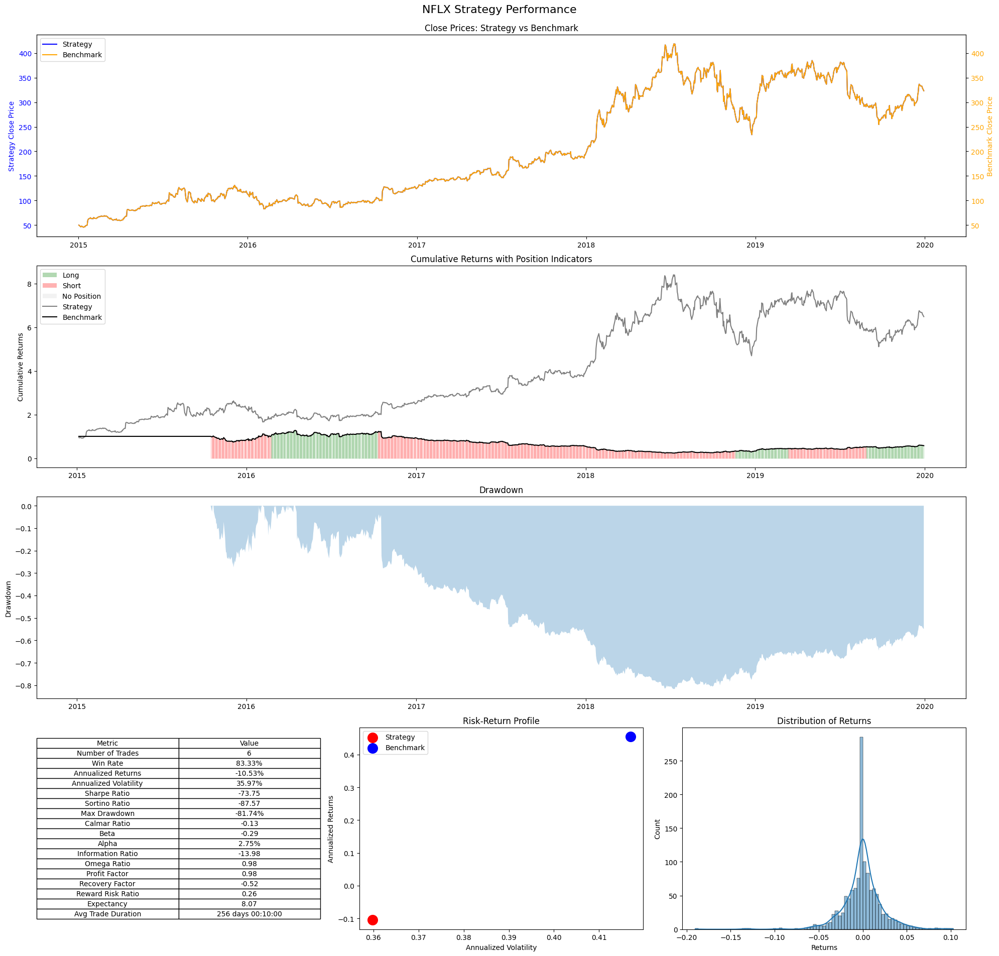

In [3]:
class YFinanceMAStrategy(YFinanceStrategy):
    def __init__(self, symbol: str, start_date: str, end_date: str, interval: str, params : dict, benchmark_symbol : str = "^GSPC", risk_free_rate : float = 0.0) -> None:
        super().__init__(symbol, start_date, end_date, interval, params, benchmark_symbol, risk_free_rate)

    def strategy(self):
        self.data_strategy['short_sma'] = self.data_strategy['Close'].rolling(window=self.params['short_window'], min_periods=self.params['short_window']).mean()
        self.data_strategy['long_sma'] = self.data_strategy['Close'].rolling(window=self.params['long_window'], min_periods=self.params['long_window']).mean()
        
        self.data_strategy['signal'] = 0
        previous_signal = 0
        for i, row in self.data_strategy.iterrows():
            if row['short_sma'] > row['long_sma']:
                self.data_strategy.at[i, 'signal'] = -1.0
            elif row['short_sma'] < row['long_sma']:
                self.data_strategy.at[i, 'signal'] = 1.0
            elif row['short_sma'] == row['long_sma']:
                self.data_strategy.at[i, 'signal'] = 0.0
            else:
                self.data_strategy.at[i, 'signal'] = previous_signal

mastrategy_1 = YFinanceMAStrategy(
    symbol="NFLX",
    start_date = '2015-01-01',
    end_date = '2019-12-31',
    interval = '1d',
    params = {'short_window': 50, 'long_window': 200},
    benchmark_symbol='NFLX',
    risk_free_rate=0.0
)
mastrategy_1.strategy()
mastrategy_1.calculate_strategy_performance()
mastrategy_1.plot_performance()

In [4]:
mastrategy_1.data_benchmark

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,timestamp_utc,returns_close,logreturns_close,MC
0,2015-01-02 00:00:00-05:00,49.151428,50.331429,48.731430,49.848572,13475000,0.0,0.0,1420174800000,NaN,NaN,308870053888
1,2015-01-05 00:00:00-05:00,49.258572,49.258572,47.147144,47.311428,18165000,0.0,0.0,1420434000000,-0.050897,-0.052238,308870053888
2,2015-01-06 00:00:00-05:00,47.347141,47.639999,45.661430,46.501431,16037700,0.0,0.0,1420520400000,-0.017121,-0.017269,308870053888
3,2015-01-07 00:00:00-05:00,47.347141,47.421429,46.271427,46.742859,9849700,0.0,0.0,1420606800000,0.005192,0.005178,308870053888
4,2015-01-08 00:00:00-05:00,47.119999,47.835712,46.478573,47.779999,9601900,0.0,0.0,1420693200000,0.022188,0.021946,308870053888
...,...,...,...,...,...,...,...,...,...,...,...,...
1252,2019-12-23 00:00:00-05:00,337.760010,337.950012,331.019989,333.100006,5765300,0.0,0.0,1577077200000,-0.011279,-0.011343,308870053888
1253,2019-12-24 00:00:00-05:00,334.010010,335.700012,331.600006,333.200012,2019300,0.0,0.0,1577163600000,0.000300,0.000300,308870053888
1254,2019-12-26 00:00:00-05:00,334.600006,336.459991,332.010010,332.630005,3589900,0.0,0.0,1577336400000,-0.001711,-0.001712,308870053888
1255,2019-12-27 00:00:00-05:00,332.959991,333.820007,326.010010,329.089996,5036100,0.0,0.0,1577422800000,-0.010642,-0.010700,308870053888


# YFinancePortfolio - A list of YFinanceStrategy

In [5]:
from typing import List, Dict, Tuple

class YFinancePortfolio:
    def __init__(self, strategies: List[YFinanceStrategy], weights: List[float] = None) -> None:
        self.strategies = strategies
        self.weights = weights if weights is not None else self._equal_weights()
        self.portfolio_performance = None

    def _equal_weights(self) -> List[float]:
        return [1.0 / len(self.strategies)] * len(self.strategies)
    def set_weights(self, weights: List[float]) -> None:
        if len(weights) != len(self.strategies):
            raise ValueError("Number of weights must match number of strategies")
        if not np.isclose(sum(weights), 1.0):
            raise ValueError("Weights must sum to 1.0")
        self.weights = weights
    def _prepare_portfolio_and_benchmark_data(self) -> Tuple[pd.DataFrame, pd.DataFrame]:
        portfolio_data = pd.DataFrame()
        benchmark_data = pd.DataFrame()

        for strategy, weight in zip(self.strategies, self.weights):
            strategy_data = strategy.get_data()
            portfolio_data[strategy.symbol] = strategy_data['returns_strategy'] * weight
            benchmark_data[strategy.symbol] = strategy_data['returns_close'] * weight

        portfolio_data['Date'] = strategy_data['Date']
        benchmark_data['Date'] = strategy_data['Date']

        portfolio_data['portfolio_returns'] = portfolio_data.drop('Date', axis=1).sum(axis=1)
        benchmark_data['benchmark_returns'] = benchmark_data.drop('Date', axis=1).sum(axis=1)

        return portfolio_data.set_index('Date'), benchmark_data.set_index('Date')

    def calculate_portfolio_performance(self) -> Dict[str, float]:
        """
        Portfolio performance should be dependent on the strategy performance, compared against its own benchmark. 

        In the context of the IS4226 Midterms, the strategy will be benchmarket against a BnH strategy.
        """
        # if not all(strategy.performance for strategy in self.strategies):
        #     raise ValueError("All strategies must have calculated performance")

        # Prepare portfolio and benchmark data
        self.portfolio_data, self.benchmark_data = self._prepare_portfolio_and_benchmark_data()

        # Align portfolio and benchmark data
        aligned_data = pd.concat([self.portfolio_data, self.benchmark_data], axis=1).dropna()

        # Calculate portfolio metrics
        portfolio_cumulative_returns = (1 + aligned_data['portfolio_returns']).cumprod()
        benchmark_cumulative_returns = (1 + aligned_data['benchmark_returns']).cumprod()

        annualized_return = calculate_annualized_return(aligned_data, 'portfolio_returns')
        benchmark_return = calculate_annualized_return(aligned_data, 'benchmark_returns')
        annualized_volatility = aligned_data['portfolio_returns'].std() * np.sqrt(252)
        sharpe_ratio = (annualized_return - self.strategies[0].risk_free_rate) / annualized_volatility
        
        max_drawdown = ((portfolio_cumulative_returns.cummax() - portfolio_cumulative_returns) / portfolio_cumulative_returns.cummax()).max()
        calmar_ratio = annualized_return / max_drawdown if max_drawdown != 0 else np.inf

        beta = calculate_beta(aligned_data['portfolio_returns'], aligned_data['benchmark_returns'])
        alpha = calculate_alpha(beta, aligned_data, 'portfolio_returns', aligned_data, 'benchmark_returns', self.strategies[0].risk_free_rate)

        self.portfolio_performance = {
            'number_strategies' : len(self.strategies),
            'annualized_return': annualized_return,
            'benchmark_return': benchmark_return,
            'annualized_volatility': annualized_volatility,
            'sharpe_ratio': sharpe_ratio,
            'max_drawdown': max_drawdown,
            'calmar_ratio': calmar_ratio,
            'beta': beta,
            'alpha': alpha
        }

    def plot_portfolio_performance(self) -> None:
        # Implement portfolio performance plotting
        if self.portfolio_performance is None:
            raise ValueError("Portfolio performance must be calculated first")

        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 18))

        # Cumulative Returns
        portfolio_cumulative_returns = (1 + self.portfolio_data['portfolio_returns']).cumprod()
        benchmark_cumulative_returns = (1 + self.benchmark_data['benchmark_returns']).cumprod()
        
        ax1.plot(portfolio_cumulative_returns.index, portfolio_cumulative_returns, label='Portfolio')
        ax1.plot(benchmark_cumulative_returns.index, benchmark_cumulative_returns, label='Benchmark')
        ax1.set_title('Cumulative Returns')
        ax1.legend()

        # Drawdown
        portfolio_drawdown = (portfolio_cumulative_returns / portfolio_cumulative_returns.cummax()) - 1
        benchmark_drawdown = (benchmark_cumulative_returns / benchmark_cumulative_returns.cummax()) - 1
        ax2.fill_between(portfolio_drawdown.index, portfolio_drawdown, 0, alpha=0.3, label='Portfolio')
        ax2.fill_between(benchmark_drawdown.index, benchmark_drawdown, 0, alpha=0.3, label='Benchmark')
        ax2.set_title('Drawdown')
        ax2.legend()

        # Performance Metrics
        metrics = [
            ('Annualized Return', f"{self.portfolio_performance['annualized_return']:.2%}"),
            ('Benchmark Return', f"{self.portfolio_performance['benchmark_return']:.2%}"),
            ('Annualized Volatility', f"{self.portfolio_performance['annualized_volatility']:.2%}"),
            ('Sharpe Ratio', f"{self.portfolio_performance['sharpe_ratio']:.2f}"),
            ('Max Drawdown', f"{self.portfolio_performance['max_drawdown']:.2%}"),
            ('Calmar Ratio', f"{self.portfolio_performance['calmar_ratio']:.2f}"),
            ('Beta', f"{self.portfolio_performance['beta']:.2f}"),
            ('Alpha', f"{self.portfolio_performance['alpha']:.2%}")
        ]

        ax3.axis('tight')
        ax3.axis('off')
        ax3.table(cellText=metrics, colLabels=['Metric', 'Value'], cellLoc='center', loc='center')

        plt.tight_layout()
        plt.show()
    def get_portfolio_performance(self) -> Dict[str, float]:
        return self.portfolio_performance

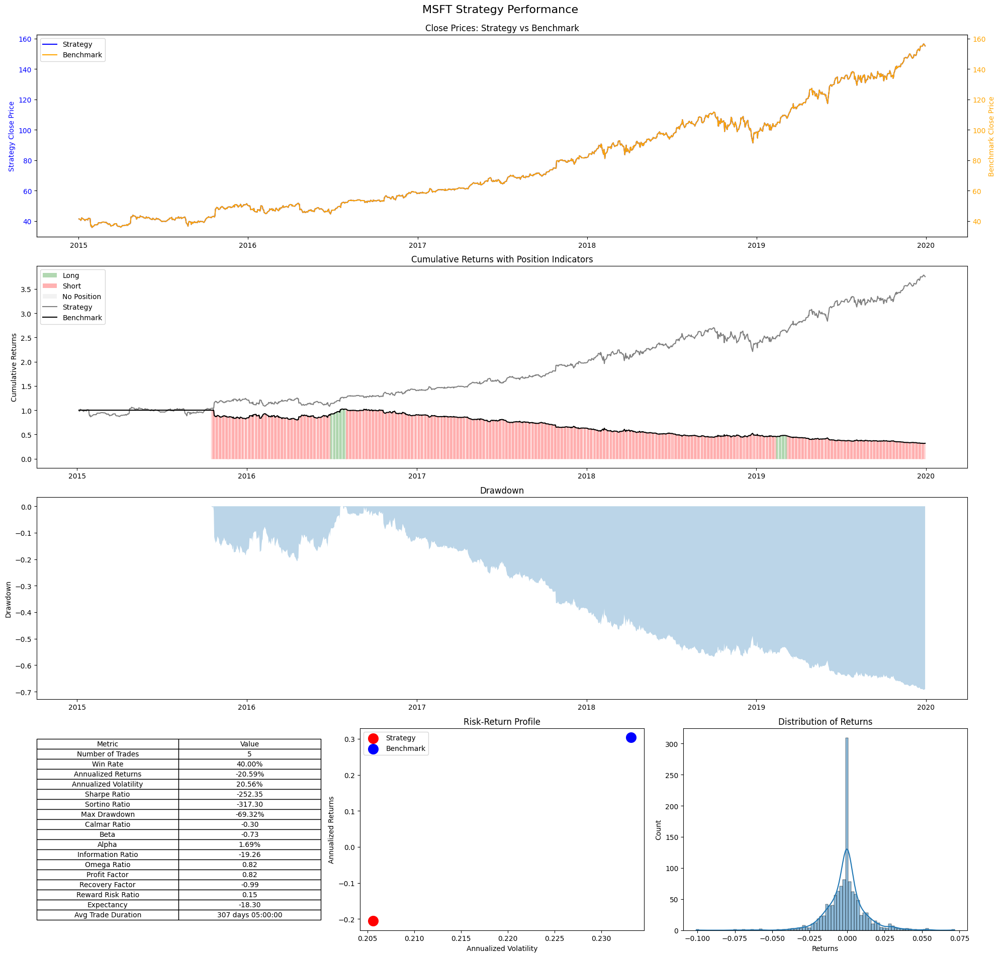

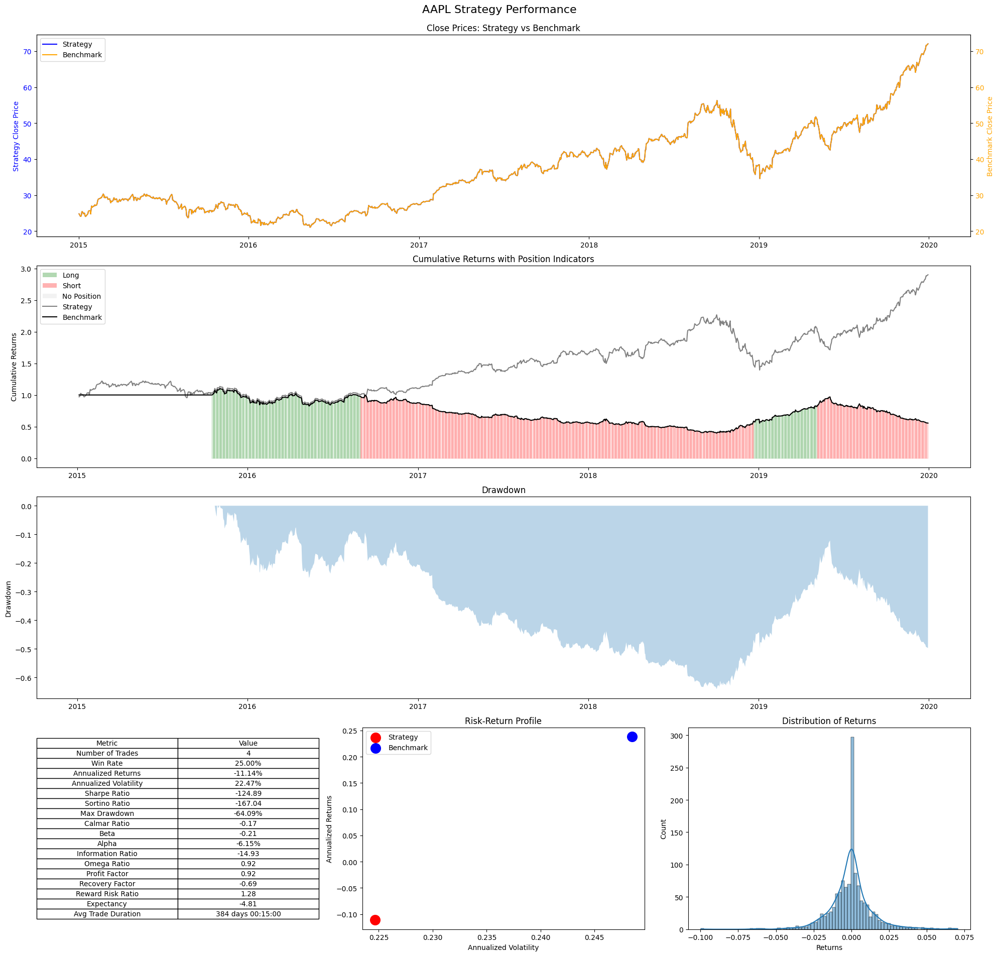

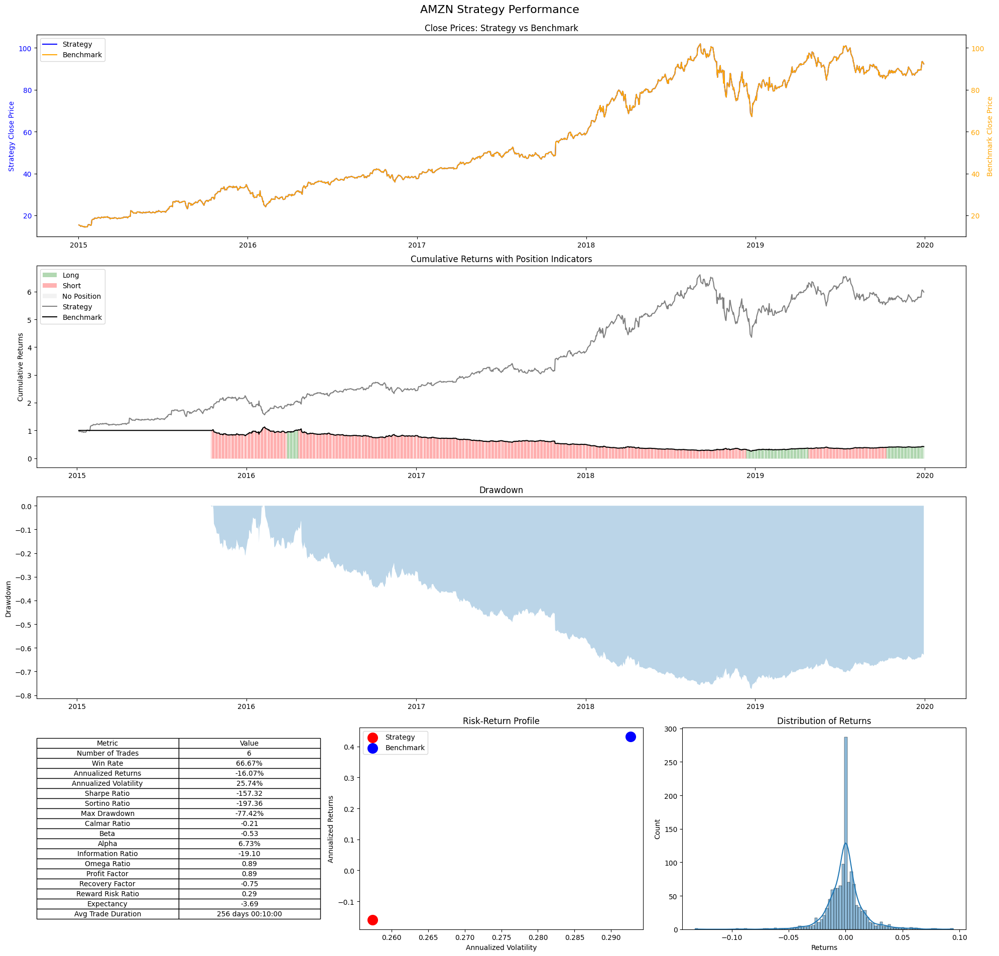

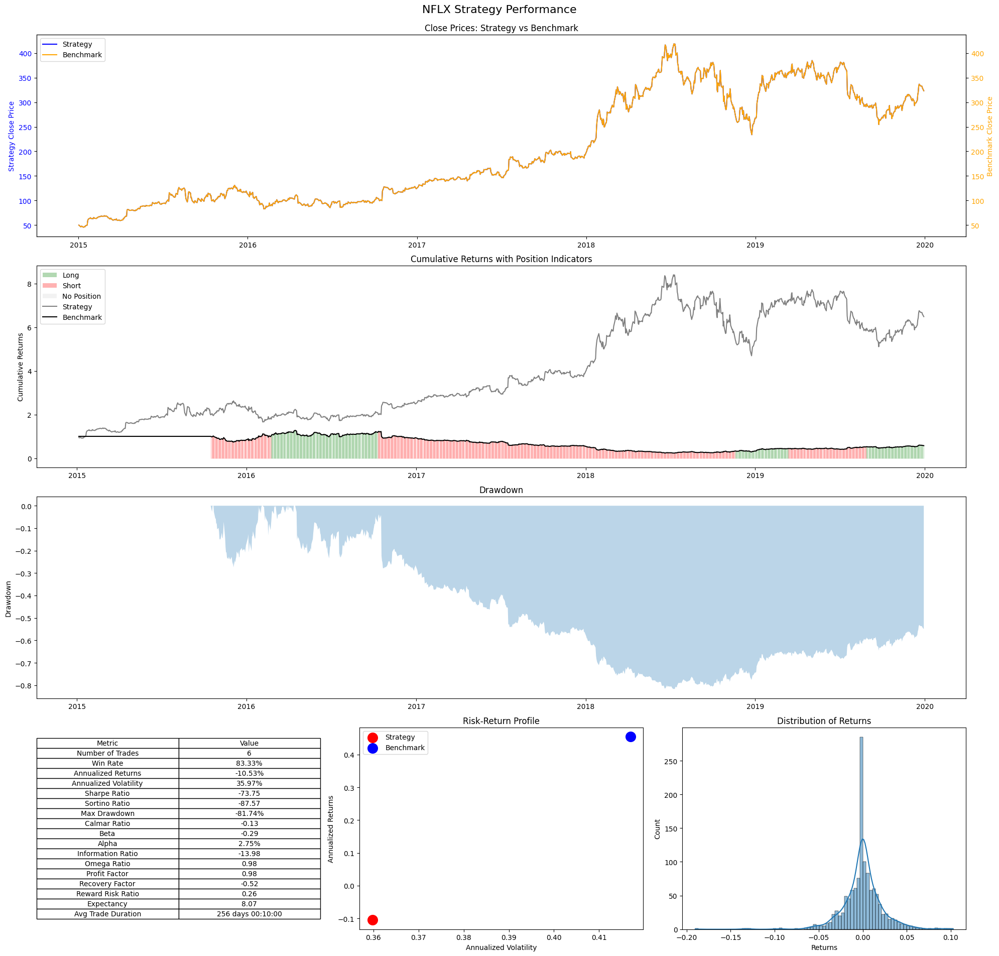

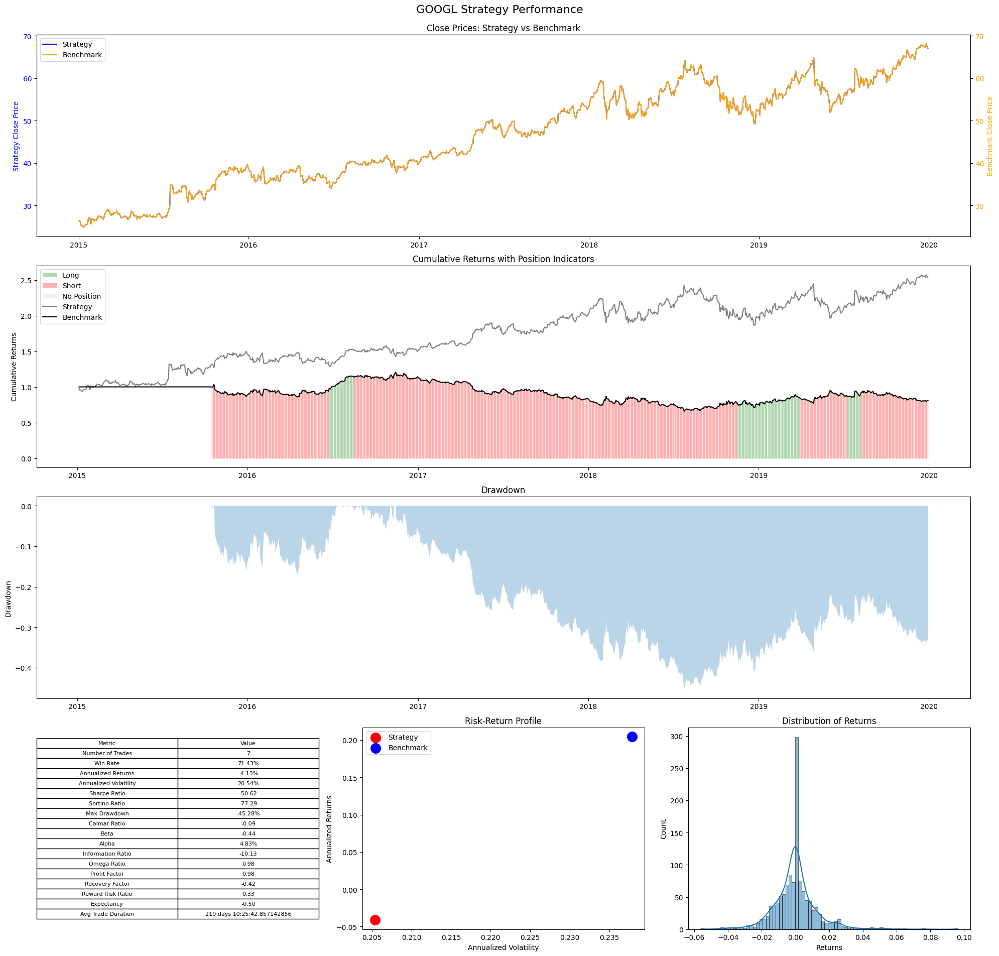

In [6]:
list_strategies = []

for s in maang_stocks:
    strategy = YFinanceMAStrategy(
        symbol=s,
        start_date = '2015-01-01',
        end_date = '2019-12-31',
        interval = '1d',
        params = {'short_window': 50, 'long_window': 200},
        benchmark_symbol=s,
        risk_free_rate=0.0
    )
    strategy.strategy()
    strategy.calculate_strategy_performance()
    strategy.plot_performance()
    list_strategies.append(strategy)

portfolio = YFinancePortfolio(list_strategies)
portfolio.calculate_portfolio_performance()

## Data Extraction

In [7]:
# I want to trade the RSI strategy on the industry market cap weighted RSI.
top_25_tech_stocks = [
    "AAPL",  # Apple
    "MSFT",  # Microsoft
    "GOOGL",  # Alphabet (Google)
    "AMZN",  # Amazon
    "NVDA",  # NVIDIA
    "META",  # Meta Platforms
    "TSLA",  # Tesla
    "TSM",   # Taiwan Semiconductor Manufacturing Company
    "AVGO",  # Broadcom
    "ORCL",  # Oracle
    "CSCO",  # Cisco Systems
    "ADBE",  # Adobe
    "CRM",   # Salesforce
    "ASML",  # ASML Holding
    "AMD",   # Advanced Micro Devices
    "ACN",   # Accenture
    "INTC",  # Intel
    "QCOM",  # Qualcomm
    "IBM",   # IBM
    "TXN",   # Texas Instruments
    # "PYPL",  # PayPal - Has missing values before 2015
    "INTU",  # Intuit
    "AMAT",  # Applied Materials
    "NOW",   # ServiceNow
    "ADP"    # Automatic Data Processing
]

start_date = '2015-01-01'
end_date = '2019-12-31'
interval = '1d'

all_data = None

for s in top_25_tech_stocks:
    try:
        data = prepare_data(s, start_date, end_date, interval)
        if all_data is None:
            all_data = data[['timestamp_utc', 'Close', 'MC']].rename(columns={'Close': s + '_Close', 'MC': s + '_MC'})
        else:
            all_data = all_data.merge(data[['timestamp_utc', 'Close', 'MC']].rename(columns={'Close': s + '_Close', 'MC': s + '_MC'}), on='timestamp_utc', how='left')
    except Exception as e:
        print(f"Error processing {s}: {e}")
all_data['datetime'] = pd.to_datetime(all_data['timestamp_utc'], unit='ms', utc=True)
all_data

,timestamp_utc,AAPL_Close,AAPL_MC,MSFT_Close,MSFT_MC,GOOGL_Close,GOOGL_MC,AMZN_Close,AMZN_MC,NVDA_Close,...,TXN_MC,INTU_Close,INTU_MC,AMAT_Close,AMAT_MC,NOW_Close,NOW_MC,ADP_Close,ADP_MC,datetime
0,1420174800000,24.819241,3448289886208,41.348206,3092590624768,26.477501,2064878272512,15.426000,1957534236672,0.339729,...,185083559936,85.688644,171165908992,22.581051,166504873984,67.379997,188910845952,72.021698,116295655424,2015-01-02 05:00:00+00:00
1,1420434000000,24.120045,3448289886208,40.967976,3092590624768,25.973000,2064878272512,15.109500,1957534236672,0.333991,...,185083559936,85.350433,171165908992,21.857300,166504873984,67.150002,188910845952,71.969826,116295655424,2015-01-05 05:00:00+00:00
2,1420520400000,24.122320,3448289886208,40.366688,3092590624768,25.332001,2064878272512,14.764500,1957534236672,0.323865,...,185083559936,82.729340,171165908992,21.034031,166504873984,66.330002,188910845952,71.373161,116295655424,2015-01-06 05:00:00+00:00
3,1420606800000,24.460564,3448289886208,40.879539,3092590624768,25.257500,2064878272512,14.921000,1957534236672,0.323021,...,185083559936,83.539581,171165908992,21.233067,166504873984,67.089996,188910845952,71.995735,116295655424,2015-01-07 05:00:00+00:00
4,1420693200000,25.400398,3448289886208,42.082142,3092590624768,25.345501,2064878272512,15.023000,1957534236672,0.335173,...,185083559936,84.660721,171165908992,21.911583,166504873984,68.889999,188910845952,73.647354,116295655424,2015-01-08 05:00:00+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252,1577077200000,70.167885,3448289886208,155.044037,3092590624768,67.531502,2064878272512,89.650002,1957534236672,5.839003,...,185083559936,263.162292,171165908992,60.047825,166504873984,283.309998,188910845952,164.360046,116295655424,2019-12-23 05:00:00+00:00
1253,1577163600000,70.234581,3448289886208,155.014450,3092590624768,67.221497,2064878272512,89.460503,1957534236672,5.834113,...,185083559936,261.235107,171165908992,60.460724,166504873984,284.200012,188910845952,164.253708,116295655424,2019-12-24 05:00:00+00:00
1254,1577336400000,71.628067,3448289886208,156.285065,3092590624768,68.123497,2064878272512,93.438499,1957534236672,5.848050,...,185083559936,263.745392,171165908992,60.273941,166504873984,286.200012,188910845952,164.679062,116295655424,2019-12-26 05:00:00+00:00
1255,1577422800000,71.600876,3448289886208,156.570709,3092590624768,67.732002,2064878272512,93.489998,1957534236672,5.791327,...,185083559936,263.933167,171165908992,60.136303,166504873984,286.880005,188910845952,165.085098,116295655424,2019-12-27 05:00:00+00:00


In [8]:
from ta.momentum import RSIIndicator

all_data_rsi = all_data.copy()

rsi_params = {
    'window': 14,
    'fillna': False
}

for s in top_25_tech_stocks:
    all_data_rsi[f'{s}_rsi'] = RSIIndicator(close = all_data_rsi[s + '_Close'],
        window=rsi_params['window'],
        fillna=rsi_params['fillna']).rsi()
all_data_rsi

,timestamp_utc,AAPL_Close,AAPL_MC,MSFT_Close,MSFT_MC,GOOGL_Close,GOOGL_MC,AMZN_Close,AMZN_MC,NVDA_Close,...,AMD_rsi,ACN_rsi,INTC_rsi,QCOM_rsi,IBM_rsi,TXN_rsi,INTU_rsi,AMAT_rsi,NOW_rsi,ADP_rsi
0,1420174800000,24.819241,3448289886208,41.348206,3092590624768,26.477501,2064878272512,15.426000,1957534236672,0.339729,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1420434000000,24.120045,3448289886208,40.967976,3092590624768,25.973000,2064878272512,15.109500,1957534236672,0.333991,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1420520400000,24.122320,3448289886208,40.366688,3092590624768,25.332001,2064878272512,14.764500,1957534236672,0.323865,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1420606800000,24.460564,3448289886208,40.879539,3092590624768,25.257500,2064878272512,14.921000,1957534236672,0.323021,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1420693200000,25.400398,3448289886208,42.082142,3092590624768,25.345501,2064878272512,15.023000,1957534236672,0.335173,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252,1577077200000,70.167885,3448289886208,155.044037,3092590624768,67.531502,2064878272512,89.650002,1957534236672,5.839003,...,75.208046,74.669320,66.584224,59.506928,56.504324,68.192342,58.307622,62.191078,62.543503,58.158664
1253,1577163600000,70.234581,3448289886208,155.014450,3092590624768,67.221497,2064878272512,89.460503,1957534236672,5.834113,...,77.577763,75.692094,67.601169,60.482775,52.922450,68.094259,55.142373,63.607956,63.289150,57.708721
1254,1577336400000,71.628067,3448289886208,156.285065,3092590624768,68.123497,2064878272512,93.438499,1957534236672,5.848050,...,77.768467,76.274095,69.851858,58.720653,52.482475,67.831441,58.316545,62.467522,64.976418,59.072681
1255,1577422800000,71.600876,3448289886208,156.570709,3092590624768,67.732002,2064878272512,93.489998,1957534236672,5.791327,...,74.362890,76.508085,71.217352,60.074954,54.574155,68.070271,58.552804,61.591199,65.556063,60.386082


In [9]:
def plot_symbol_and_rsi(df, symbol):
    """
    Plot the symbol's price on one axis and its RSI on another axis.
    
    :param df: DataFrame containing the data
    :param symbol: String, the symbol to plot (e.g., 'AMAT')
    """
    fig, ax1 = plt.subplots(figsize=(20, 6))

    # Plot symbol price
    ax1.plot(df['datetime'], df[symbol + '_Close'], color='blue', label=f'{symbol} Price')
    ax1.set_xlabel('Date')
    ax1.set_ylabel(f'{symbol} Price', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # Create second y-axis for RSI
    ax2 = ax1.twinx()
    ax2.plot(df['datetime'], df[f'{symbol}_rsi'], color='red', label=f'{symbol} RSI')
    ax2.set_ylabel('RSI', color='red')
    ax2.tick_params(axis='y', labelcolor='red')

    plt.title(f'{symbol} Price and RSI Over Time')
    fig.tight_layout()
    plt.show()

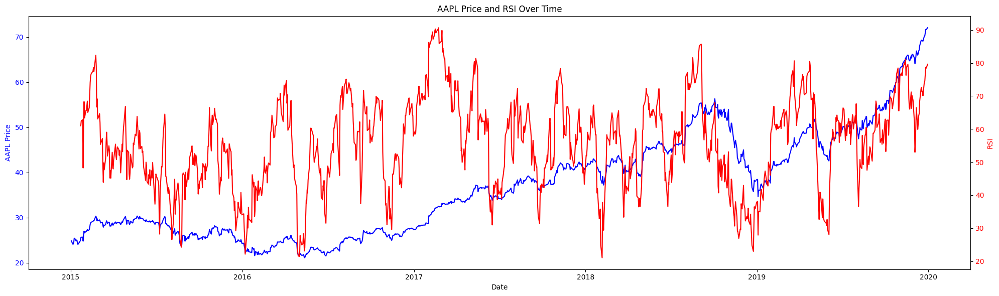

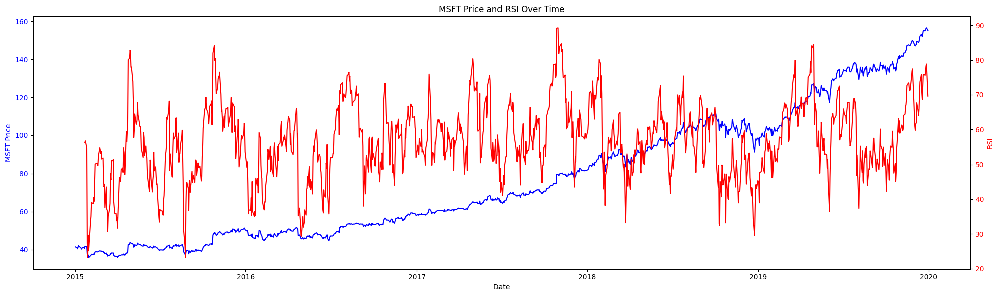

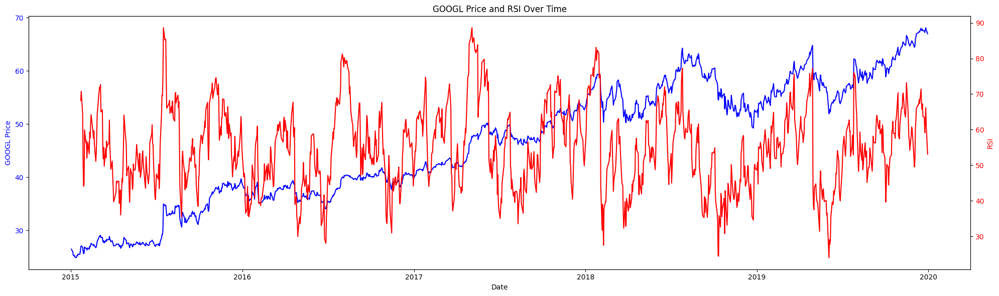

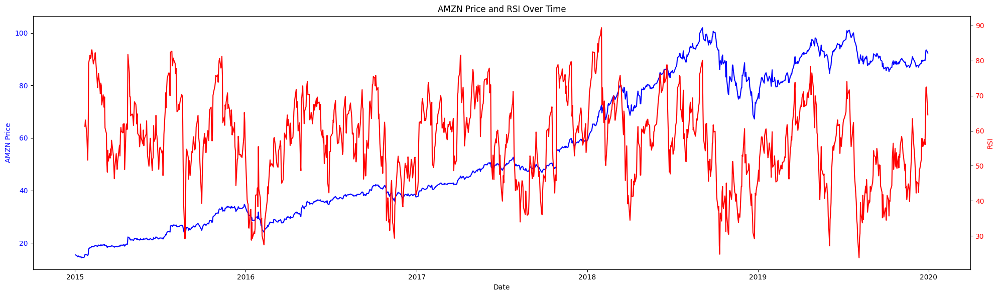

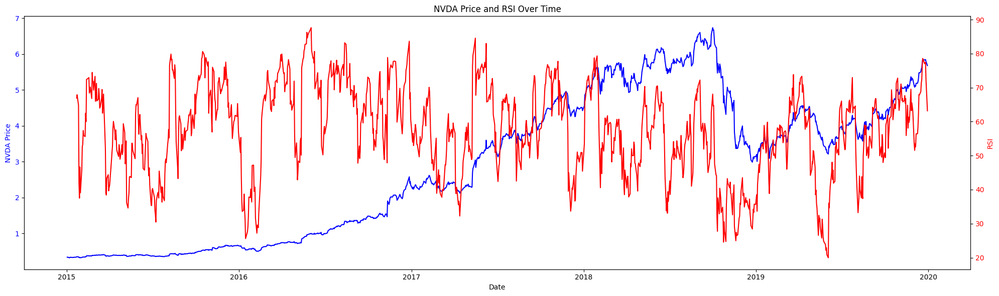

...

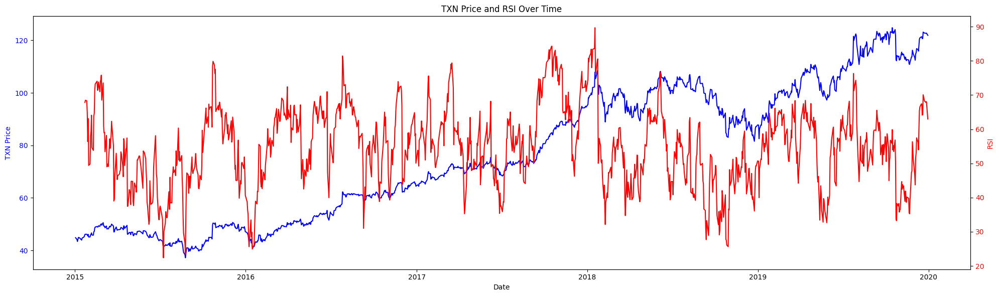

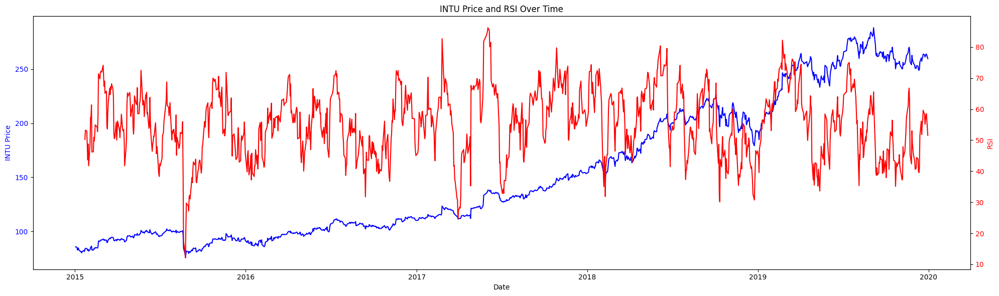

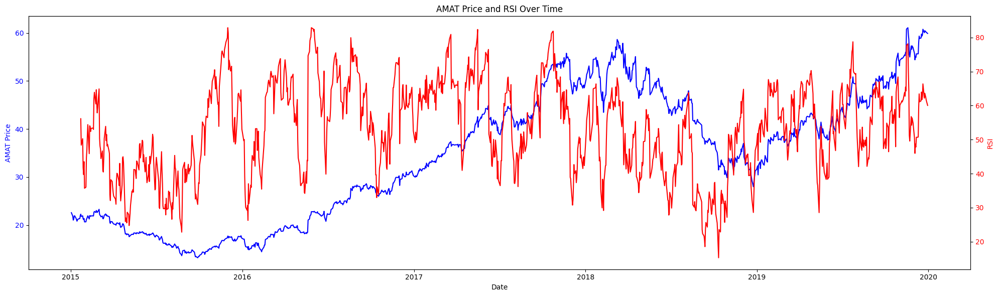

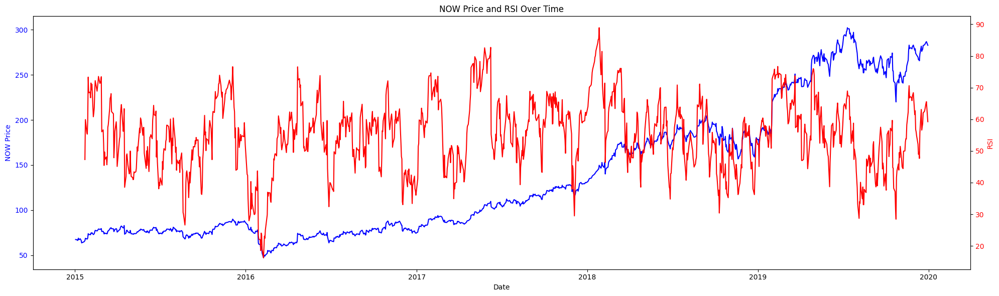

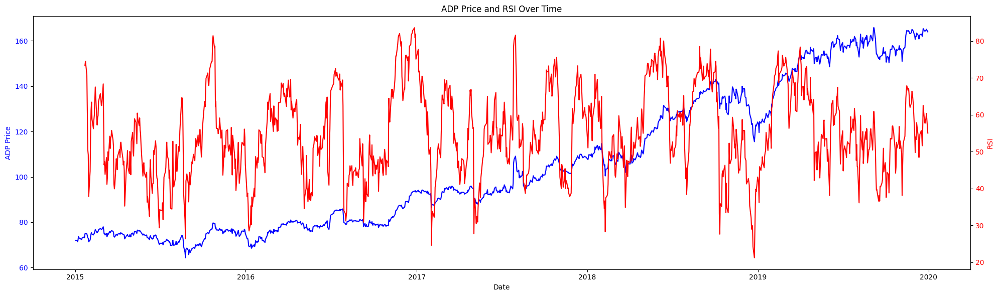

In [10]:
for s in top_25_tech_stocks:
    plot_symbol_and_rsi(all_data_rsi, s)

In [11]:
all_data_rsi['total_MC'] = all_data_rsi[[f'{s}_MC' for s in top_25_tech_stocks]].sum(axis=1)

for s in top_25_tech_stocks:
    all_data_rsi[f'{s}_weight'] = all_data_rsi[f'{s}_MC'] / all_data_rsi['total_MC']
    all_data_rsi[f'{s}_mcweighted_rsi'] = all_data_rsi[f'{s}_rsi'] * all_data_rsi[f'{s}_weight']

all_data_rsi['all_mcweighted_rsi'] = all_data_rsi[[f'{s}_mcweighted_rsi' for s in top_25_tech_stocks]].sum(axis=1)
industry_mcweighted_rsi = all_data_rsi.dropna().reset_index(drop=True)[['timestamp_utc', 'datetime', 'all_mcweighted_rsi']]
industry_mcweighted_rsi

,timestamp_utc,datetime,all_mcweighted_rsi
0,1421902800000,2015-01-22 05:00:00+00:00,59.920949
1,1421989200000,2015-01-23 05:00:00+00:00,61.085346
2,1422248400000,2015-01-26 05:00:00+00:00,59.660970
3,1422334800000,2015-01-27 05:00:00+00:00,45.900256
4,1422421200000,2015-01-28 05:00:00+00:00,44.938253
...,...,...,...
1239,1577077200000,2019-12-23 05:00:00+00:00,70.085620
1240,1577163600000,2019-12-24 05:00:00+00:00,69.006015
1241,1577336400000,2019-12-26 05:00:00+00:00,72.813782
1242,1577422800000,2019-12-27 05:00:00+00:00,71.592345


<Axes: title={'center': 'Industry MC Weighted RSI'}, xlabel='datetime'>

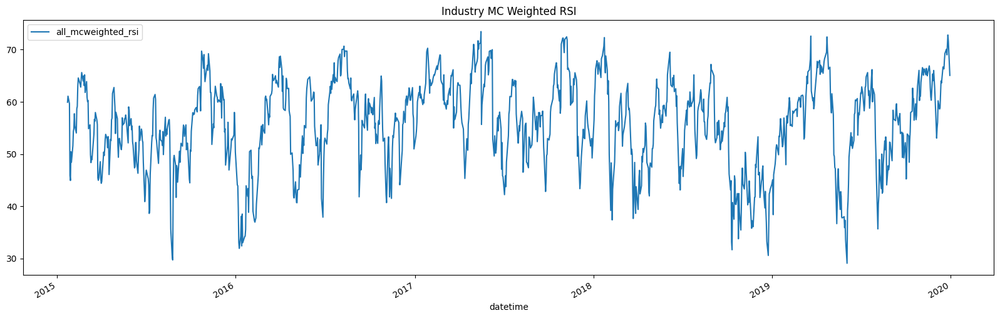

In [12]:
industry_mcweighted_rsi.plot(x='datetime', y='all_mcweighted_rsi', figsize=(20, 6), title="Industry MC Weighted RSI")

# Strategy Development

In [13]:
top_25_tech_stocks = [
    "AAPL",  # Apple
    "MSFT",  # Microsoft
    "GOOGL",  # Alphabet (Google)
    "AMZN",  # Amazon
    "NVDA",  # NVIDIA
    "META",  # Meta Platforms
    "TSLA",  # Tesla
    "TSM",   # Taiwan Semiconductor Manufacturing Company
    "AVGO",  # Broadcom
    "ORCL",  # Oracle
    "CSCO",  # Cisco Systems
    "ADBE",  # Adobe
    "CRM",   # Salesforce
    "ASML",  # ASML Holding
    "AMD",   # Advanced Micro Devices
    "ACN",   # Accenture
    "INTC",  # Intel
    "QCOM",  # Qualcomm
    "IBM",   # IBM
    "TXN",   # Texas Instruments
    # "PYPL",  # PayPal - Has missing values before 2015
    "INTU",  # Intuit
    "AMAT",  # Applied Materials
    "NOW",   # ServiceNow
    "ADP"    # Automatic Data Processing
]
from ta.momentum import RSIIndicator

def generate_mcweighted_rsi(symbols, start_date, end_date, interval, rsi_window):
    all_data = None
    for s in symbols:
        try:
            data = prepare_data(s, start_date, end_date, interval)
            if all_data is None:
                all_data = data[['timestamp_utc', 'Close', 'MC']].rename(columns={'Close': s + '_Close', 'MC': s + '_MC'})
            else:
                all_data = all_data.merge(data[['timestamp_utc', 'Close', 'MC']].rename(columns={'Close': s + '_Close', 'MC': s + '_MC'}), on='timestamp_utc', how='left')
        except Exception as e:
            print(f"Error processing {s}: {e}")
    all_data_rsi = all_data.copy()
    rsi_params = {
        'window': rsi_window,
        'fillna': False
    }
    for s in symbols:
        all_data_rsi[f'{s}_rsi'] = RSIIndicator(close = all_data_rsi[s + '_Close'],
            window=rsi_params['window'],
            fillna=rsi_params['fillna']).rsi()
    all_data_rsi['total_MC'] = all_data_rsi[[f'{s}_MC' for s in top_25_tech_stocks]].sum(axis=1)

    for s in top_25_tech_stocks:
        all_data_rsi[f'{s}_weight'] = all_data_rsi[f'{s}_MC'] / all_data_rsi['total_MC']
        all_data_rsi[f'{s}_mcweighted_rsi'] = all_data_rsi[f'{s}_rsi'] * all_data_rsi[f'{s}_weight']

    all_data_rsi['industry_mcweighted_rsi'] = all_data_rsi[[f'{s}_mcweighted_rsi' for s in top_25_tech_stocks]].sum(axis=1)
    industry_mcweighted_rsi = all_data_rsi.dropna().reset_index(drop=True)[['timestamp_utc','industry_mcweighted_rsi']]
    return industry_mcweighted_rsi

generate_mcweighted_rsi(top_25_tech_stocks, start_date=start_date, end_date=end_date, interval=interval, rsi_window=14)

,timestamp_utc,industry_mcweighted_rsi
0,1421902800000,59.920949
1,1421989200000,61.085346
2,1422248400000,59.660970
3,1422334800000,45.900256
4,1422421200000,44.938253
...,...,...
1239,1577077200000,70.085620
1240,1577163600000,69.006015
1241,1577336400000,72.813782
1242,1577422800000,71.592345


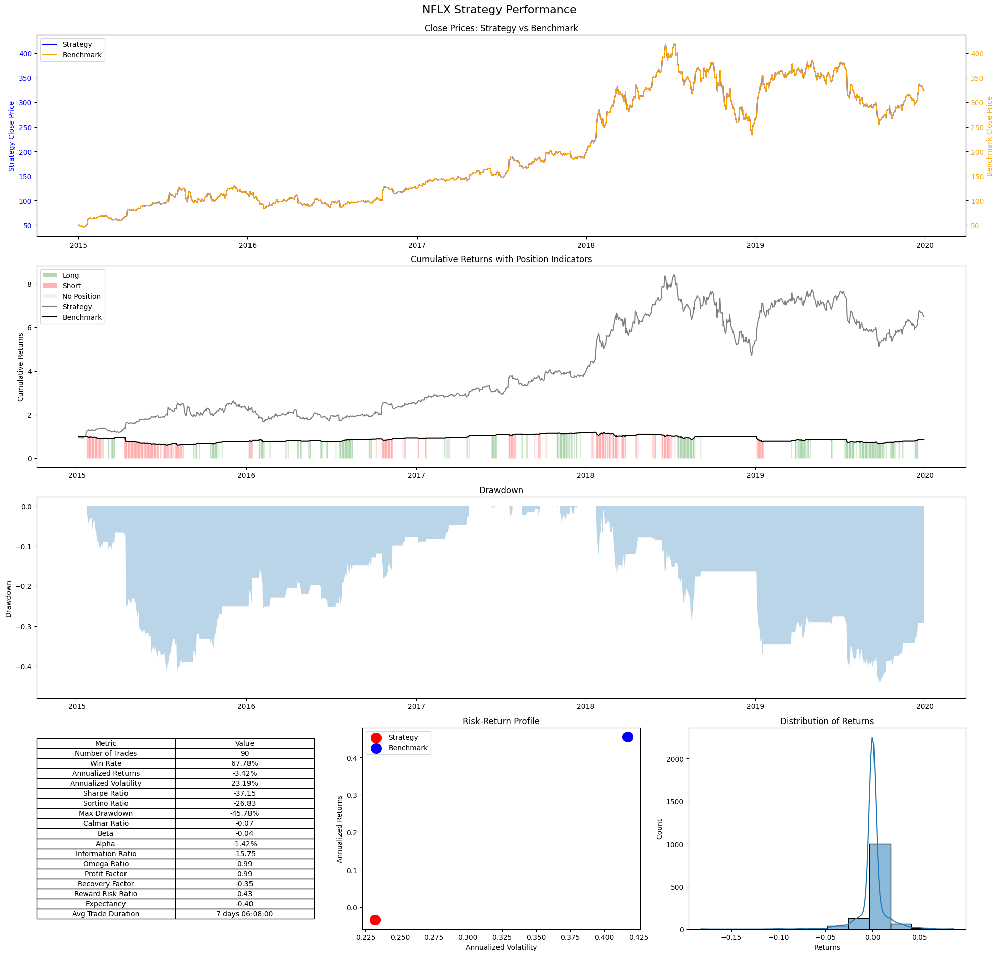

In [14]:
class YFinance_RSI_MCWEIGHTED_Strategy(YFinanceStrategy):
    def __init__(self, symbol: str, start_date: str, end_date: str, interval: str, params : dict, benchmark_symbol : str = "^GSPC", risk_free_rate : float = 0.0) -> None:
        super().__init__(symbol, start_date, end_date, interval, params, benchmark_symbol, risk_free_rate)

    def strategy(self):
        """
        1. Generate MC Weighted RSI Signal.
        2. Calculate Symbol RSI.
        3. Generate Signal based on Symbol RSI.
        """
        self.data_strategy['rsi'] = RSIIndicator(close = self.data_strategy['Close'], window = self.params['rsi_window'],fillna=False).rsi()
        top_25_tech_stocks = [
            "AAPL",  # Apple
            "MSFT",  # Microsoft
            "GOOGL",  # Alphabet (Google)
            "AMZN",  # Amazon
            "NVDA",  # NVIDIA
            "META",  # Meta Platforms
            "TSLA",  # Tesla
            "TSM",   # Taiwan Semiconductor Manufacturing Company
            "AVGO",  # Broadcom
            "ORCL",  # Oracle
            "CSCO",  # Cisco Systems
            "ADBE",  # Adobe
            "CRM",   # Salesforce
            "ASML",  # ASML Holding
            "AMD",   # Advanced Micro Devices
            "ACN",   # Accenture
            "INTC",  # Intel
            "QCOM",  # Qualcomm
            "IBM",   # IBM
            "TXN",   # Texas Instruments
            # "PYPL",  # PayPal - Has missing values before 2015
            "INTU",  # Intuit
            "AMAT",  # Applied Materials
            "NOW",   # ServiceNow
            "ADP"    # Automatic Data Processing
        ]
        df_industry_rsi = generate_mcweighted_rsi(symbols=top_25_tech_stocks, start_date=self.start_date, end_date=self.end_date, interval=self.interval, rsi_window=self.params['rsi_window'])
        self.data_strategy = self.data_strategy.merge(right=df_industry_rsi, on = 'timestamp_utc', how = 'left')
        self.data_strategy['rsi_delta'] = self.data_strategy['rsi'] - self.data_strategy['industry_mcweighted_rsi']

        self.data_strategy['signal'] = 0
        self.data_strategy['signal'] = np.where(self.data_strategy['rsi_delta'] > self.params['upper_limit'], -1, np.where(self.data_strategy['rsi_delta'] < -self.params['lower_limit'], 1, 0))

rsi_mcweighted_strategy_1 = YFinance_RSI_MCWEIGHTED_Strategy(
    symbol="NFLX",
    start_date = '2015-01-01',
    end_date = '2019-12-31',
    interval = '1d',
    params = {'rsi_window' : 14, 'upper_limit' : 10, 'lower_limit' : 10},
    benchmark_symbol='NFLX',
    risk_free_rate=0.0
)
rsi_mcweighted_strategy_1.strategy()
rsi_mcweighted_strategy_1.calculate_strategy_performance()
rsi_mcweighted_strategy_1.plot_performance()

<Axes: xlabel='Date'>

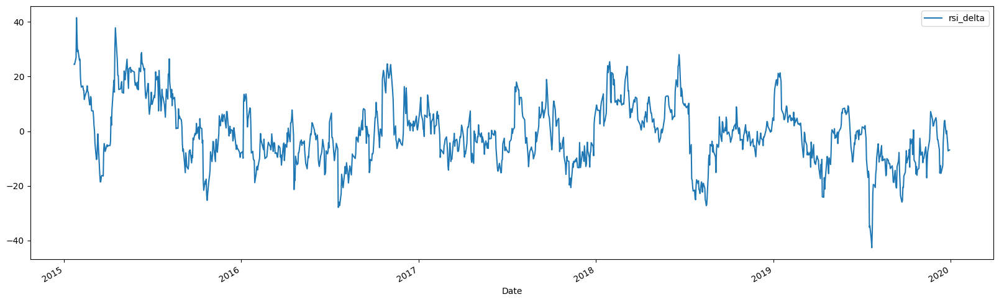

In [15]:
rsi_mcweighted_strategy_1.data_strategy.plot(
    x='Date',
    y='rsi_delta',
    figsize=(20,6)
)

# Portfolio Optimization
[Insert Explanation Here]

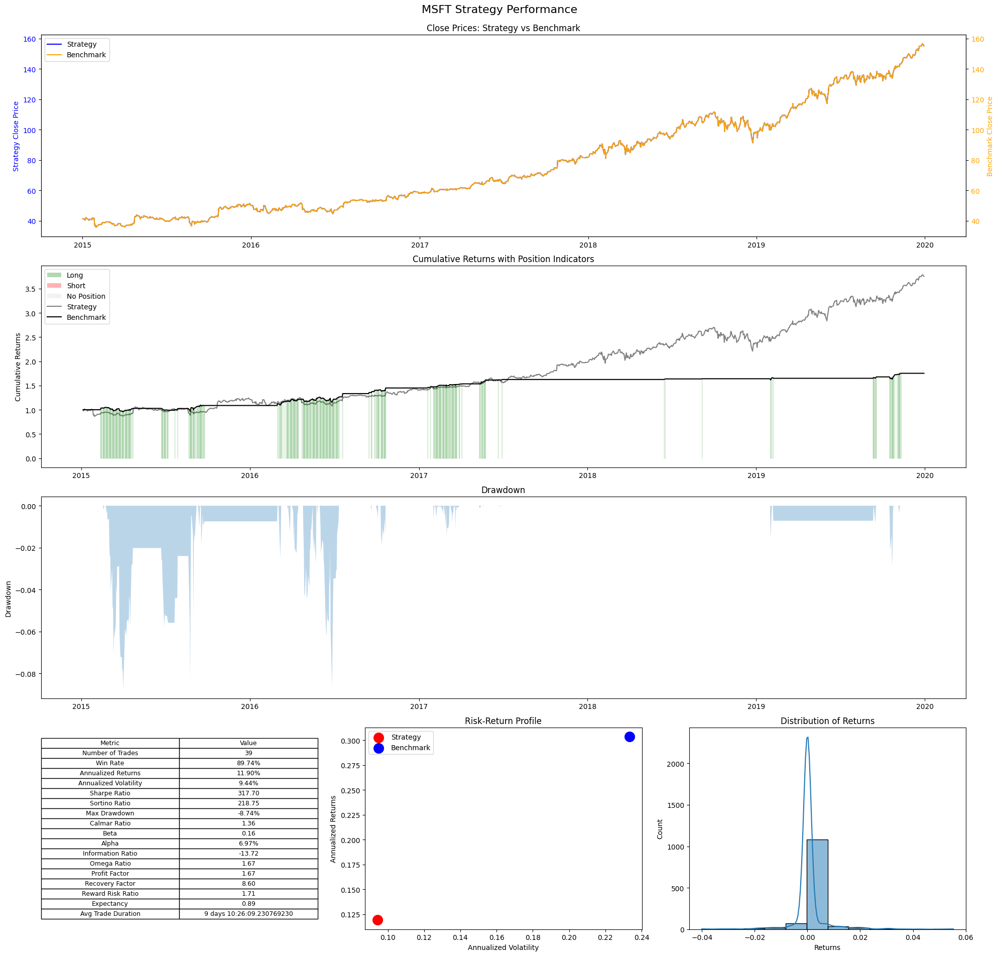

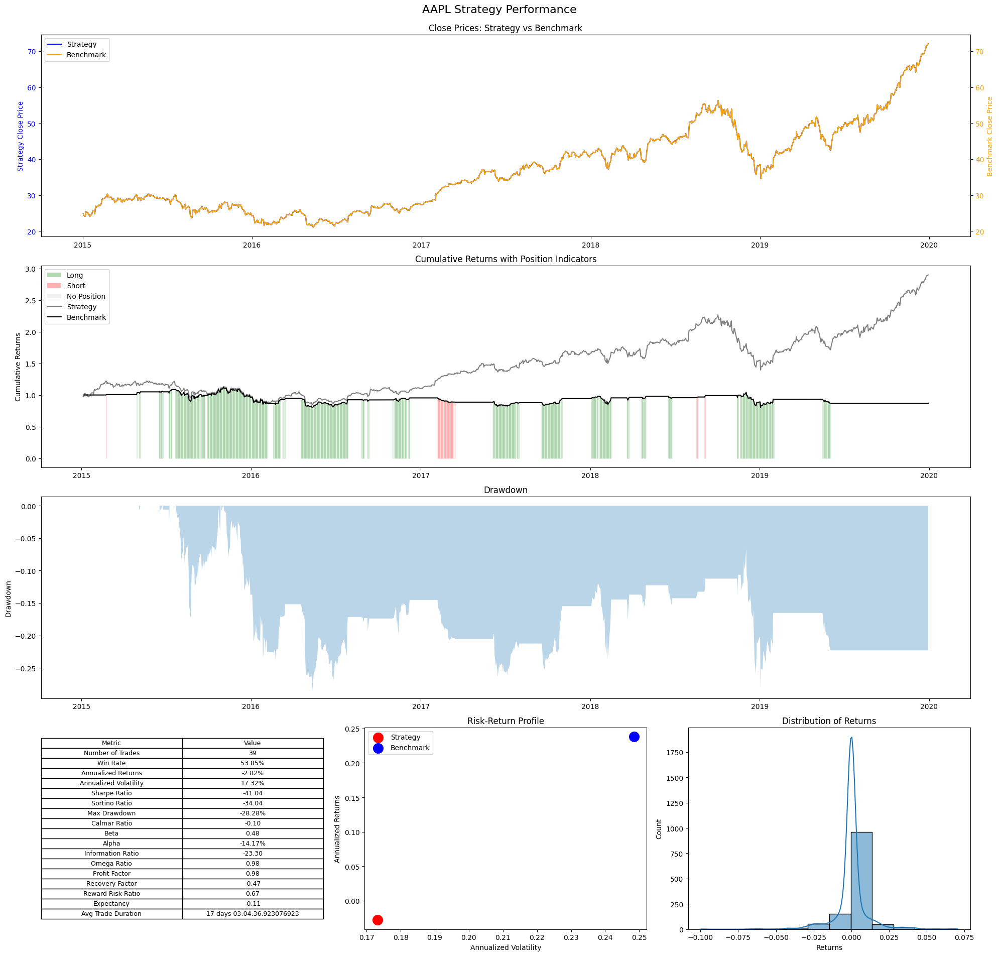

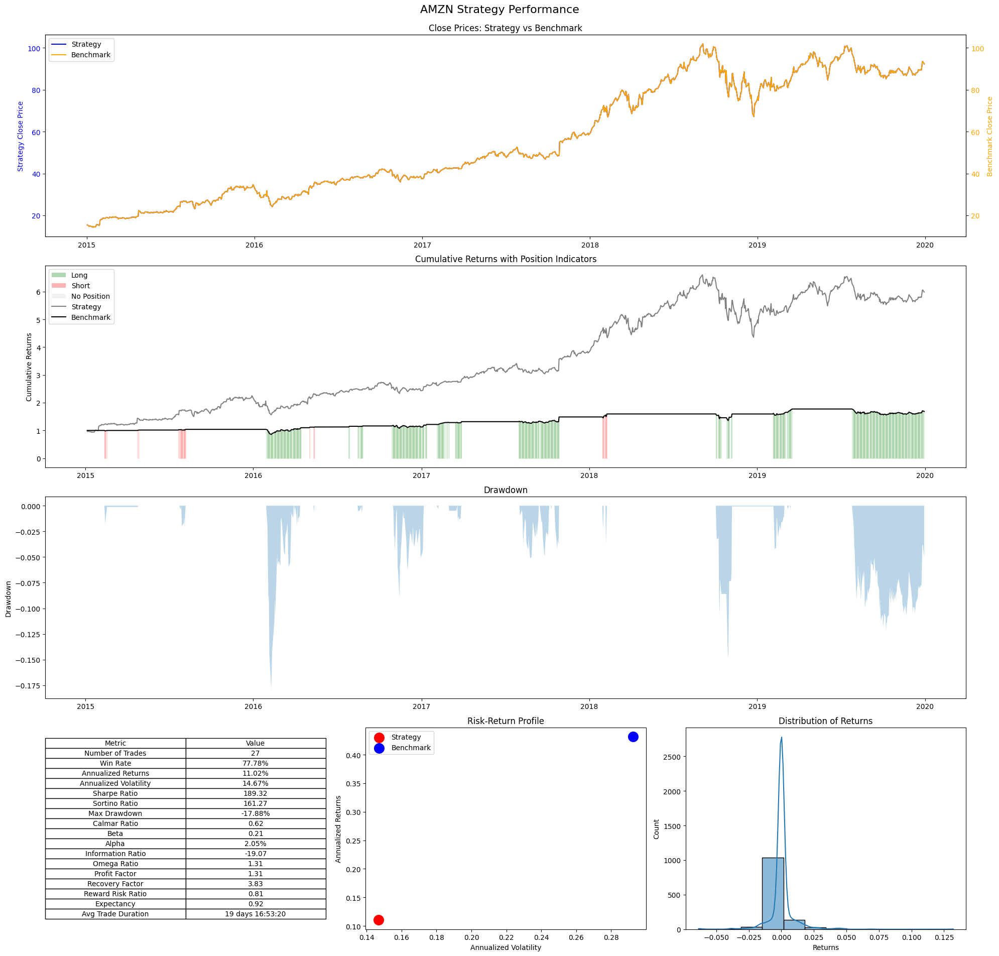

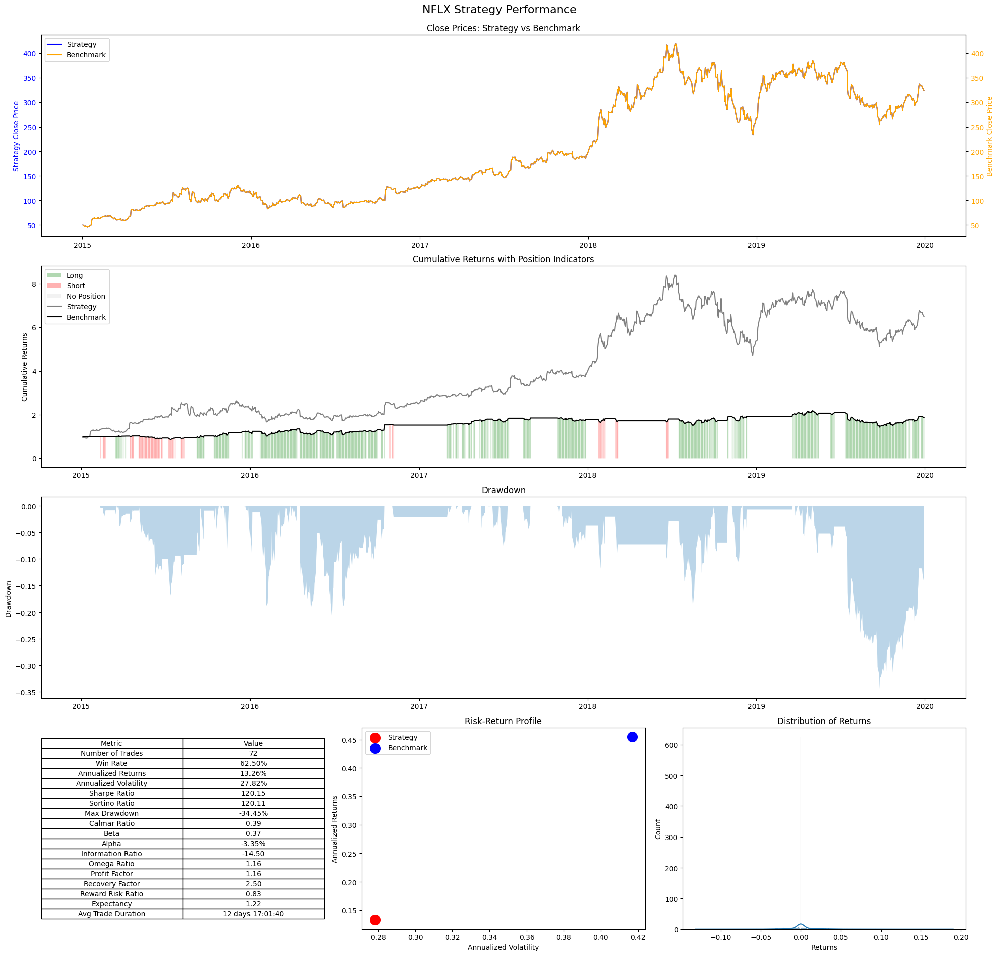

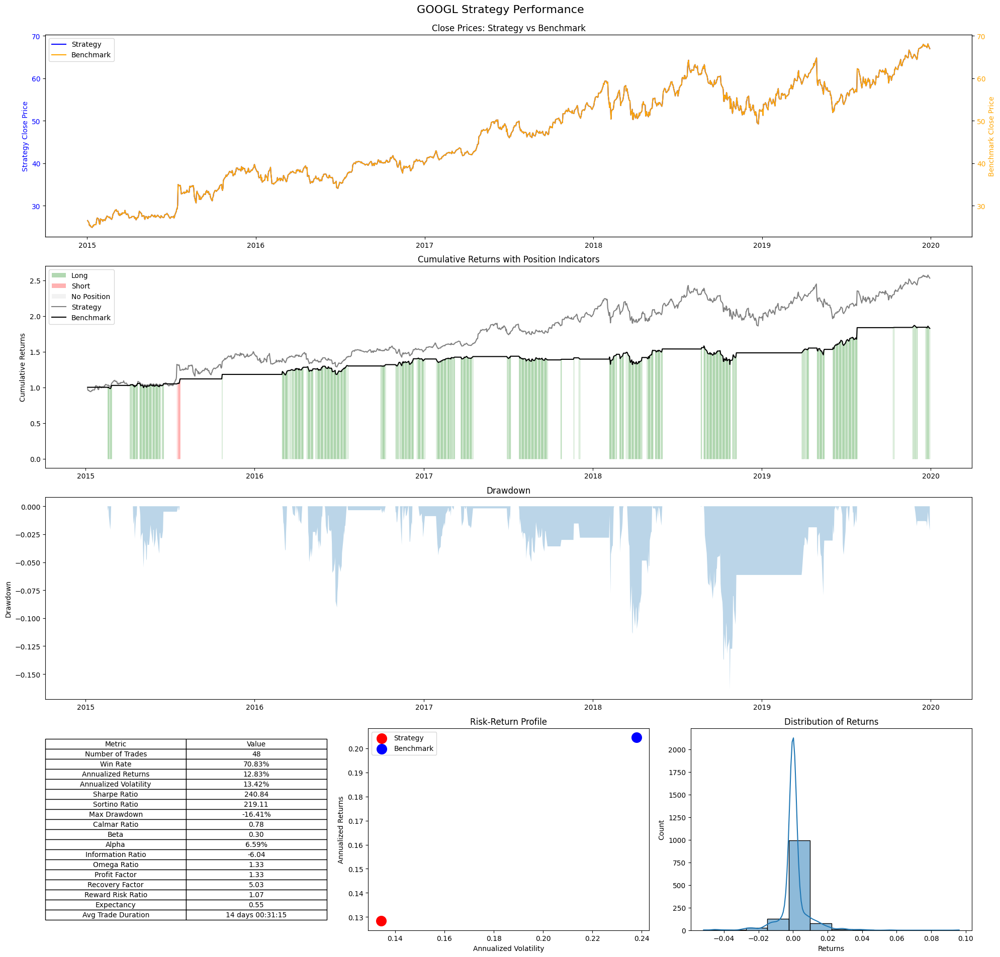

In [25]:
rsi_mcweighted_list_strategies = []

for s in maang_stocks:
    strategy = YFinance_RSI_MCWEIGHTED_Strategy(
        symbol=s,
        start_date = '2015-01-01',
        end_date = '2019-12-31',
        interval = '1d',
        params = {'rsi_window' : 28, 'upper_limit' : 15, 'lower_limit' : 2.5},
        benchmark_symbol=s,
        risk_free_rate=0.0
    )
    strategy.strategy()
    strategy.calculate_strategy_performance()
    strategy.plot_performance()
    rsi_mcweighted_list_strategies.append(strategy)

portfolio = YFinancePortfolio(list_strategies)
portfolio.calculate_portfolio_performance()

In [24]:
portfolio.portfolio_performance

{'number_strategies': 5,
 'annualized_return': -0.11052586691761446,
 'benchmark_return': 0.34678145196890764,
 'annualized_volatility': 0.1725591909090045,
 'sharpe_ratio': -0.640509881481178,
 'max_drawdown': 0.6085646724623414,
 'calmar_ratio': -0.18161729051804912,
 'beta': -0.46113745191386873,
 'alpha': 0.049388048214319274}

In [18]:
from itertools import product

rsi_window = [7, 14, 21, 28]
limits = [2.5, 5, 10, 12.5, 15, 17.5, 20]

optimization_parameters = product(rsi_window, limits, limits)

portfolio_optimization = []

for wind, ul, ll in optimization_parameters:
    temp_list_strategies = []
    for s in maang_stocks:
        strategy = YFinance_RSI_MCWEIGHTED_Strategy(
            symbol=s,
            start_date = '2015-01-01',
            end_date = '2019-12-31',
            interval = '1d',
            params = {'rsi_window' : wind, 'upper_limit' : ul, 'lower_limit' : ll},
            benchmark_symbol=s,
            risk_free_rate=0.0
        )
        strategy.strategy()
        strategy.calculate_strategy_performance()
        temp_list_strategies.append(strategy)
    temp_portfolio = YFinancePortfolio(temp_list_strategies)
    temp_portfolio.calculate_portfolio_performance()
    temp_portfolio.portfolio_performance.update({
        'rsi_window' : wind,
        'upper_limit' : ul,
        'lower_limit' : ll
    })
    portfolio_optimization.append(temp_portfolio.portfolio_performance)
    print(f"""Testing for rsi:{rsi_window}, ul: {ul}, ll: {ll}""")
portfolio_optimization

Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 2.5
Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 5
Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 10
Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 12.5
Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 15
Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 17.5
Testing for rsi:[7, 14, 21, 28], ul: 2.5, ll: 20
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 2.5
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 5
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 10
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 12.5
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 15
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 17.5
Testing for rsi:[7, 14, 21, 28], ul: 5, ll: 20
Testing for rsi:[7, 14, 21, 28], ul: 10, ll: 2.5
Testing for rsi:[7, 14, 21, 28], ul: 10, ll: 5
Testing for rsi:[7, 14, 21, 28], ul: 10, ll: 10
Testing for rsi:[7, 14, 21, 28], ul: 10, ll: 12.5
Testing for rsi:[7, 14, 21, 28], ul: 10, ll: 15
Testing for rsi:[7, 14, 21, 28], ul: 10, ll: 17.5
Testing for rsi:[7, 14, 21, 

[{'number_strategies': 5,
  'annualized_return': -0.004955002874579617,
  'benchmark_return': 0.34678145196890764,
  'annualized_volatility': 0.11405826187532343,
  'sharpe_ratio': -0.043442735257494175,
  'max_drawdown': 0.2732146815632188,
  'calmar_ratio': -0.01813593195735012,
  'beta': 0.014460477859972539,
  'alpha': -0.009969628383025137,
  'rsi_window': 7,
  'upper_limit': 2.5,
  'lower_limit': 2.5},
 {'number_strategies': 5,
  'annualized_return': -0.03697416840075329,
  'benchmark_return': 0.34678145196890764,
  'annualized_volatility': 0.10489065224920548,
  'sharpe_ratio': -0.35250203529012153,
  'max_drawdown': 0.3286390906755977,
  'calmar_ratio': -0.11250690940248126,
  'beta': -0.08805429540236055,
  'alpha': -0.006438571989023593,
  'rsi_window': 7,
  'upper_limit': 2.5,
  'lower_limit': 5},
 {'number_strategies': 5,
  'annualized_return': -0.05454106904259304,
  'benchmark_return': 0.34678145196890764,
  'annualized_volatility': 0.1047089063757109,
  'sharpe_ratio': -

In [22]:
df_portfolio_optimization = pd.DataFrame(portfolio_optimization).sort_values('sharpe_ratio', ascending=False)
df_portfolio_optimization

,number_strategies,annualized_return,benchmark_return,annualized_volatility,sharpe_ratio,max_drawdown,calmar_ratio,beta,alpha,rsi_window,upper_limit,lower_limit
175,5,0.102680,0.346781,0.095737,1.072522,0.103092,0.996003,0.305523,-0.003270,28,15.0,2.5
189,5,0.101694,0.346781,0.095137,1.068931,0.103092,0.986447,0.322568,-0.010166,28,20.0,2.5
182,5,0.100866,0.346781,0.095373,1.057595,0.103092,0.978413,0.319137,-0.009805,28,17.5,2.5
141,5,0.076758,0.346781,0.074580,1.029206,0.093522,0.820747,0.212809,0.002960,21,20.0,5.0
91,5,0.096427,0.346781,0.098747,0.976510,0.083678,1.152359,0.330824,-0.018296,14,20.0,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...
152,5,-0.108269,0.346781,0.101645,-1.065168,0.457088,-0.236868,-0.353486,0.014313,28,2.5,17.5
55,5,-0.113734,0.346781,0.106472,-1.068209,0.461398,-0.246499,-0.366555,0.013380,14,2.5,20.0
54,5,-0.113403,0.346781,0.106156,-1.068263,0.453962,-0.249807,-0.358295,0.010847,14,2.5,17.5
153,5,-0.109267,0.346781,0.101754,-1.073841,0.458292,-0.238423,-0.356389,0.014322,28,2.5,20.0


In [31]:
df_portfolio_optimization = pd.DataFrame(portfolio_optimization).sort_values('annualized_return', ascending=False)
df_portfolio_optimization

,number_strategies,annualized_return,benchmark_return,annualized_volatility,sharpe_ratio,max_drawdown,calmar_ratio,beta,alpha,rsi_window,upper_limit,lower_limit
175,5,0.102680,0.346781,0.095737,1.072522,0.103092,0.996003,0.305523,-0.003270,28,15.0,2.5
189,5,0.101694,0.346781,0.095137,1.068931,0.103092,0.986447,0.322568,-0.010166,28,20.0,2.5
182,5,0.100866,0.346781,0.095373,1.057595,0.103092,0.978413,0.319137,-0.009805,28,17.5,2.5
91,5,0.096427,0.346781,0.098747,0.976510,0.083678,1.152359,0.330824,-0.018296,14,20.0,2.5
140,5,0.094192,0.346781,0.096616,0.974908,0.095787,0.983340,0.327069,-0.019230,21,20.0,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...
152,5,-0.108269,0.346781,0.101645,-1.065168,0.457088,-0.236868,-0.353486,0.014313,28,2.5,17.5
153,5,-0.109267,0.346781,0.101754,-1.073841,0.458292,-0.238423,-0.356389,0.014322,28,2.5,20.0
54,5,-0.113403,0.346781,0.106156,-1.068263,0.453962,-0.249807,-0.358295,0.010847,14,2.5,17.5
55,5,-0.113734,0.346781,0.106472,-1.068209,0.461398,-0.246499,-0.366555,0.013380,14,2.5,20.0


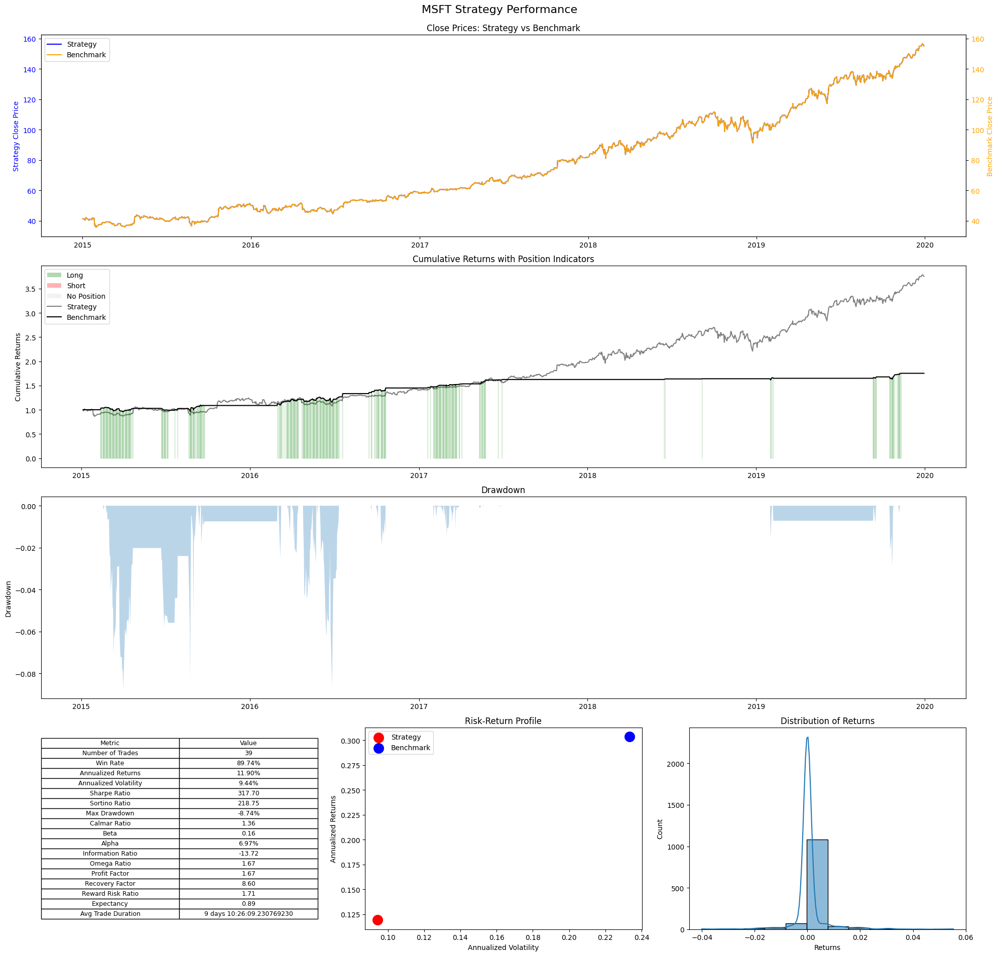

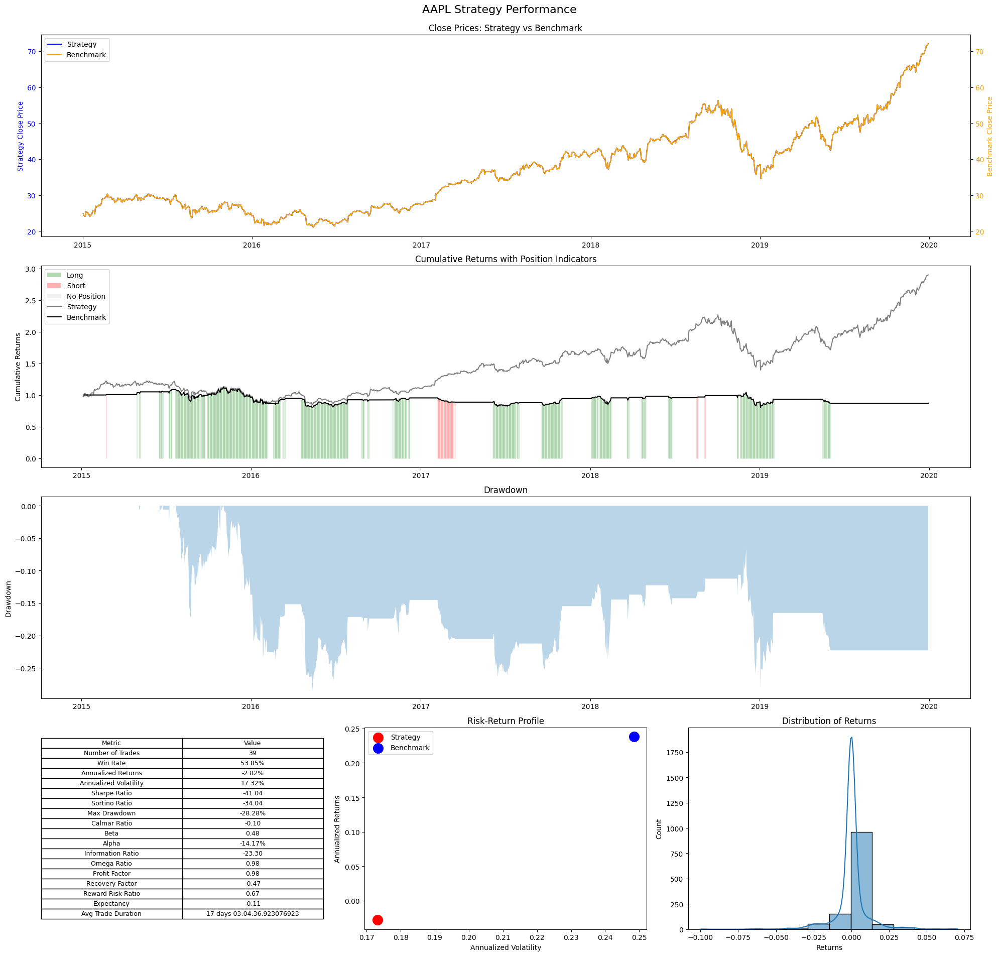

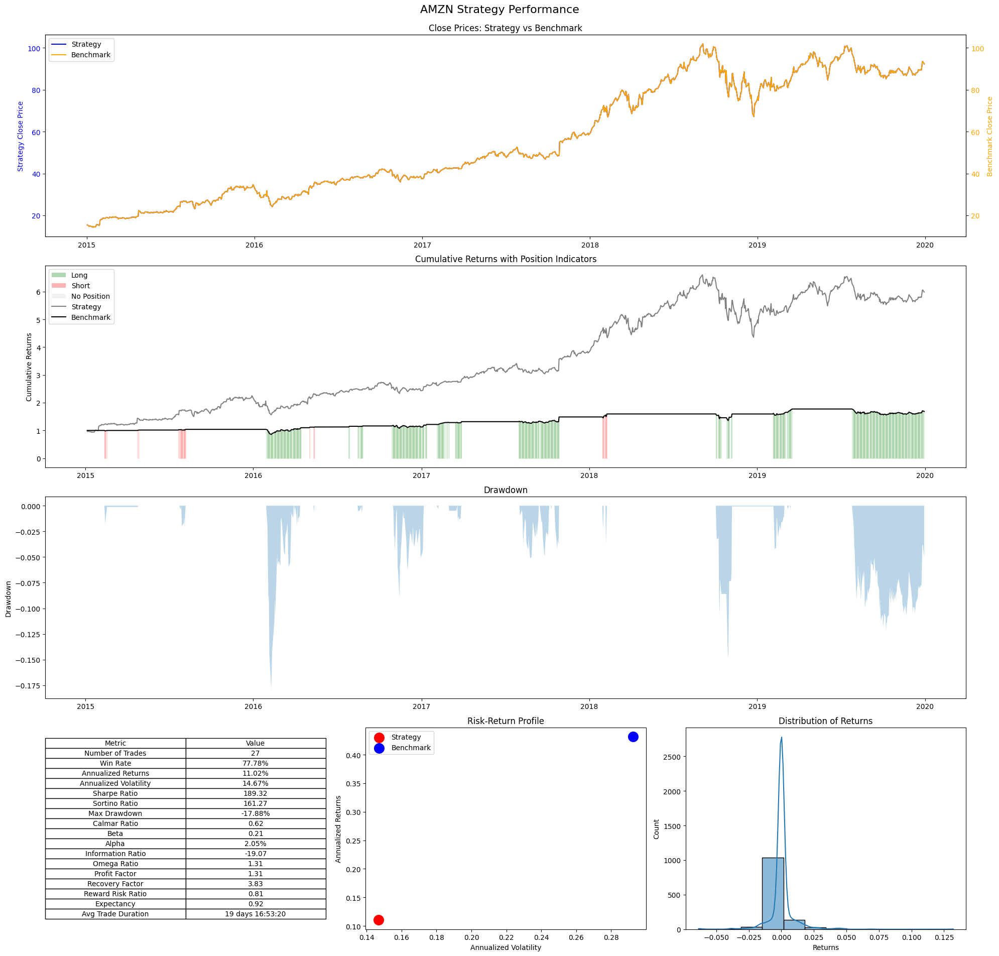

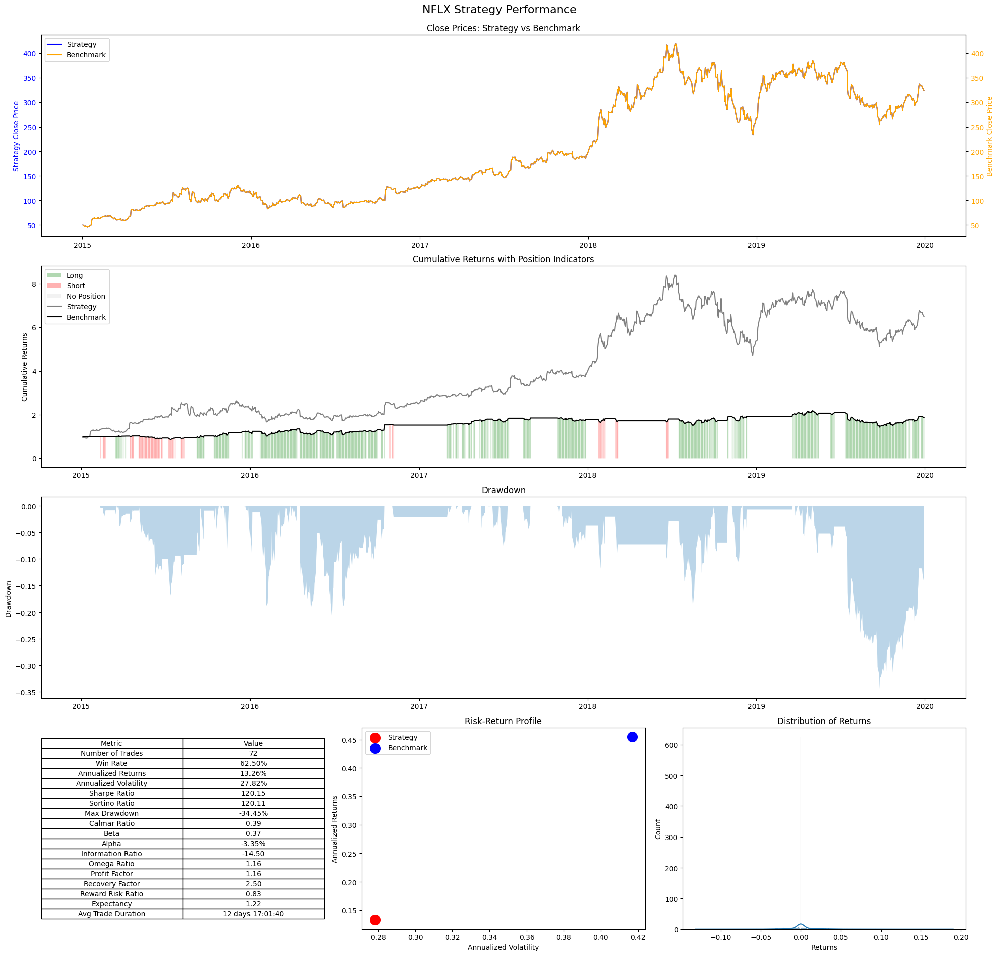

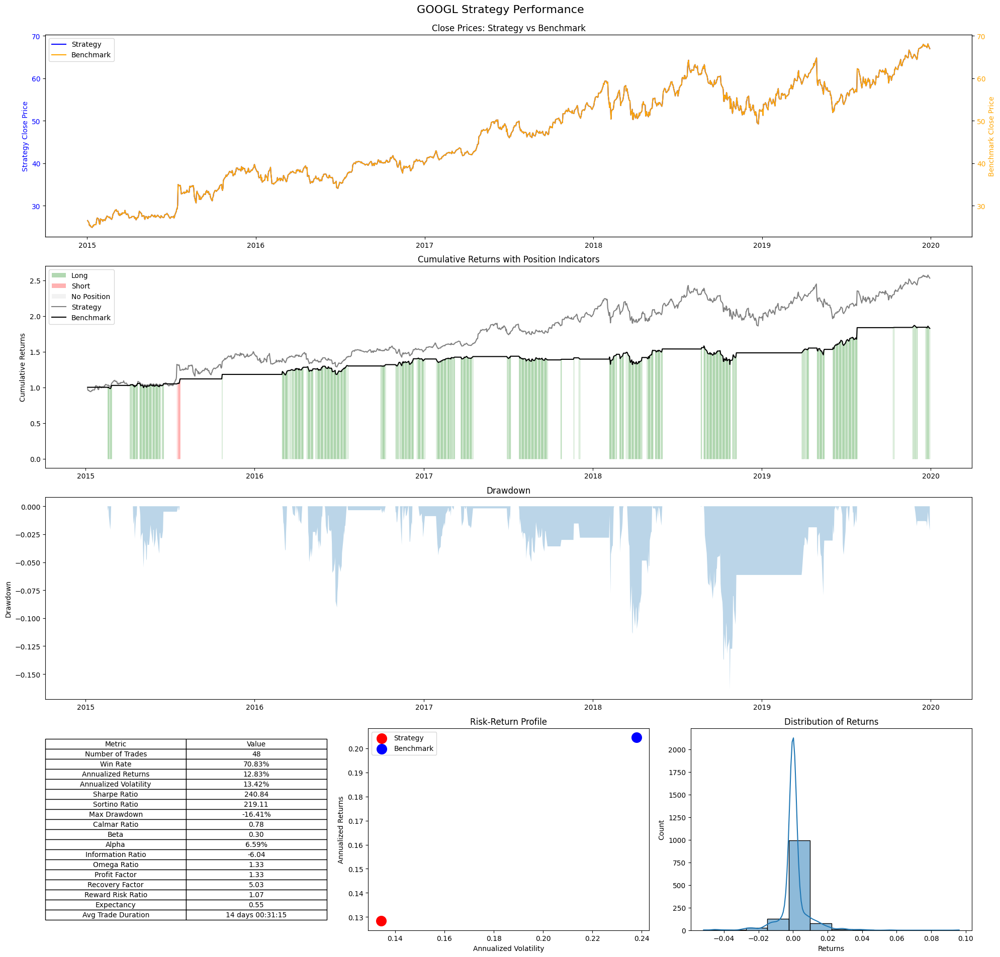

In [29]:
rsi_mcweighted_list_strategies = []

for s in maang_stocks:
    strategy = YFinance_RSI_MCWEIGHTED_Strategy(
        symbol=s,
        start_date = '2015-01-01',
        end_date = '2019-12-31',
        interval = '1d',
        params = {'rsi_window' : 28, 'upper_limit' : 15, 'lower_limit' : 2.5},
        benchmark_symbol=s,
        risk_free_rate=0.0
    )
    strategy.strategy()
    strategy.calculate_strategy_performance()
    strategy.plot_performance()
    rsi_mcweighted_list_strategies.append(strategy)

portfolio_rsi_mcweighted = YFinancePortfolio(rsi_mcweighted_list_strategies)
portfolio_rsi_mcweighted.calculate_portfolio_performance()

# Performance Analysis

## Win Rate / Returns
[Insert Explanation Here]


## Risk
[Insert Explanation Here]


## Performance Metrics
[Insert Explanation Here]


# Limitations
[Insert Explanation Here]



# Conclusion
[Insert Explanation Here]